In [1]:
import os
import pandas as pd
import numpy as np
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats.mstats import pearsonr
from flexitext import flexitext
import matplotlib.pyplot as plt





Run lmm regression:

Pos_arousal = w_score + NAcc_TR_x + (subject)

### Notes
#### Offset: 
- When combining both types of trailers, anterior insula shows a significant positive correlation with negative arousal (r=0.17489; p-value=1.7246341016483672e-06). Also, anterior insual shows a negative correlation with watch scores (r=-0.07491; p-value=0.04175856809627057).
- For horror trailers alone, NAcc has a significant positive correlation with positive arousal (r=0.15077; p-value= 0.003743392014030906); AIns has a significant positive correlation with negative arousal (r=0.13562; p-value=0.009192194315207748). 
- For comedy trailers alone, NAcc has a significant negative correlation with positive arousal (r=-0.11963; p-value=0.021179442433856898). Also, NAcc is negatively correlated with watch scores (r=0.10155; p-value=0.050637663806451946).
#### Positive peak: 
- When combining both trailers, the positive peak of AIns is positively correlated with negative arousal (r=0.092; p-value=0.01235140998911575)
#### Negative peak: 


- Cut out any neural point that has a z-score>3.
- remove watch score bigger than 3.
- Get peak, above 1 std above zero.


# Homemade functions

In [2]:

def plot_correlations_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot. 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the second plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the third plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the fifth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the sixth plot.
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-2, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)



In [3]:

def plot_correlations3_bothTrailers(dataset_df, type, comedy_corr, horror_corr, title):
    
    # Define ROI labels. 
    NAcc_label = "NAcc_" + type
    AIns_label = "AIns_" + type
    MPFC_label = "MPFC_" + type

    whole_both_trailers_plot = sns.pairplot(
        dataset_df,
        kind="reg",
        x_vars=[NAcc_label, AIns_label, MPFC_label],
        y_vars=["Pos_arousal_scaled", "Neg_arousal_scaled", "W_score_scaled"], 
        hue="Type",
        palette="viridis", 
        #scatter_kws = {"s":3} try to change the size of the dots
        height=5,
        aspect=1.2)
    
    whole_both_trailers_plot.fig.suptitle(title, y=1.03, fontsize=20, fontweight ="bold")
    plt.rc('legend', fontsize=25, title_fontsize=28, markerscale=2)

    # Add annotations to the first plot (NAcc-Pos_arousal_scaled). 
    comedy_cor_string = "C r= " + str(round(comedy_corr[0][0], 4)) + "; p-value: " + str(round(comedy_corr[0][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[0][0], 4)) + "; p-value: " + str(round(horror_corr[0][1], 5))
    whole_both_trailers_plot.axes[0, 0].text(s=horror_cor_string, x=.07, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 0].text(s=comedy_cor_string, x=.07, y=-.95, fontsize=12)

    # Add annotations to the second plot (NAcc-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[1][0], 4)) + "; p-value: " + str(round(comedy_corr[1][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[1][0], 4)) + "; p-value: " + str(round(horror_corr[1][1], 5))
    whole_both_trailers_plot.axes[1, 0].text(s=horror_cor_string, x=.07, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 0].text(s=comedy_cor_string, x=.07, y=-1.05, fontsize=12)

    # Add annotations to the third plot (NAcc-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[2][0], 4)) + "; p-value: " + str(round(comedy_corr[2][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[2][0], 4)) + "; p-value: " + str(round(horror_corr[2][1], 5))
    whole_both_trailers_plot.axes[2, 0].text(s=horror_cor_string, x=.07, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 0].text(s=comedy_cor_string, x=.07, y=-2.3, fontsize=12)

    # Add annotations to the fourth plot (AIns-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[3][0], 4)) + "; p-value: " + str(round(comedy_corr[3][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[3][0], 4)) + "; p-value: " + str(round(horror_corr[3][1], 5))
    whole_both_trailers_plot.axes[0, 1].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 1].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the fifth plot (AIns-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[4][0], 4)) + "; p-value: " + str(round(comedy_corr[4][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[4][0], 4)) + "; p-value: " + str(round(horror_corr[4][1], 5))
    whole_both_trailers_plot.axes[1, 1].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 1].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the sixth plot (AIns-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[5][0], 4)) + "; p-value: " + str(round(comedy_corr[5][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[5][0], 4)) + "; p-value: " + str(round(horror_corr[5][1], 5))
    whole_both_trailers_plot.axes[2, 1].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 1].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)

    # Add annotations to the seventh plot (MPFC-Pos_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[6][0], 4)) + "; p-value: " + str(round(comedy_corr[6][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[6][0], 4)) + "; p-value: " + str(round(horror_corr[6][1], 5))
    whole_both_trailers_plot.axes[0, 2].text(s=horror_cor_string, x=.03, y=-.85, fontsize=12)
    whole_both_trailers_plot.axes[0, 2].text(s=comedy_cor_string, x=.03, y=-.95, fontsize=12)

    # Add annotations to the eighth plot (MPFC-Neg_arousal_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[7][0], 4)) + "; p-value: " + str(round(comedy_corr[7][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[7][0], 4)) + "; p-value: " + str(round(horror_corr[7][1], 5))
    whole_both_trailers_plot.axes[1, 2].text(s=horror_cor_string, x=.03, y=-.95, fontsize=12)
    whole_both_trailers_plot.axes[1, 2].text(s=comedy_cor_string, x=.03, y=-1.05, fontsize=12)

    # Add annotations to the ninth plot (MPFC-W_score_scaled).
    comedy_cor_string = "C r= " + str(round(comedy_corr[8][0], 4)) + "; p-value: " + str(round(comedy_corr[8][1], 5))
    horror_cor_string = "H r= " + str(round(horror_corr[8][0], 4)) + "; p-value: " + str(round(horror_corr[8][1], 5))
    whole_both_trailers_plot.axes[2, 2].text(s=horror_cor_string, x=.03, y=-2.1, fontsize=12)
    whole_both_trailers_plot.axes[2, 2].text(s=comedy_cor_string, x=.03, y=-2.3, fontsize=12)




In [4]:
# Fuction to create scatter plots with corr.
def plot_correlations(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.regplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green")
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

In [5]:
# Fuction to create scatter plots with corr.
def plot_correlations_2trailers(data_df, correlations_list, type_of_signal, title_fig):

    fig, ax = plt.subplots(3, 3, figsize=(30, 30))

    NAcc_label = "NAcc_" + type_of_signal 
    AIns_label = "AIns_" + type_of_signal
    MPFC_label = "MPFC_" + type_of_signal

    # NAcc and positive arousal
    Nacc_pa_plot = sns.relplot(data=data_df, x=NAcc_label, y="Pos_arousal_scaled", hue="Type", ax=ax[0, 0])
    title1 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Positive arousal</>" 
    flexitext(0.2, 1.035, title1, va="top", ax=ax[0, 0])
    r_value1 = "<weight:bold, size:15>r=" + str(round(correlations_list[0][0], 5)) + "; p-value: "+ str(round(correlations_list[0][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value1, ha="center", ax=ax[0, 0])

    # NAcc and negative arousal
    NAcc_na_plot = sns.regplot(data=data_df, x=NAcc_label, y="Neg_arousal_scaled", ax=ax[1, 0])
    title2 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Negative arousal</>"
    flexitext(0.2, 1.035, title2, va="top", ax=ax[1, 0])
    r_value2 = "<weight:bold, size:15>r=" + str(round(correlations_list[1][0], 5)) + "; p-value: "+ str(round(correlations_list[1][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value2, ha="center", ax=ax[1, 0])

    # NAcc and watch score
    NAcc_wa_plot = sns.regplot(data=data_df, x=NAcc_label, y="W_score_scaled", ax=ax[2, 0])
    title3 = "<size:15>Corr <color:blue>" + NAcc_label + "</> and Watch score</>"
    flexitext(0.2, 1.035, title3, va="top", ax=ax[2, 0])
    r_value3 = "<weight:bold, size:15>r=" + str(round(correlations_list[2][0], 5)) + "; p-value: "+ str(round(correlations_list[2][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value3, ha="center", ax=ax[2, 0])

    # AIns and positive arousal
    AIns_pa_plot = sns.regplot(data=data_df, x=AIns_label, y="Pos_arousal_scaled", ax=ax[0, 1], color="red")
    title4 = "<size:15>Corr <color:red>AIns</> and Positive arousal</>"
    flexitext(0.2, 1.035, title4, va="top", ax=ax[0, 1])
    r_value4 = "<weight:bold, size:15>r=" + str(round(correlations_list[3][0], 5)) + "; p-value: "+str(round(correlations_list[3][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value4, ha="center", ax=ax[0, 1])

    # AIns and negative arousal
    AIns_na_plot = sns.regplot(data=data_df, x=AIns_label, y="Neg_arousal_scaled", ax=ax[1, 1], color="red")
    title5 = "<size:15>Corr <color:red>AIns</> and Negative arousal</>"
    flexitext(0.2, 1.035, title5, va="top", ax=ax[1, 1])
    r_value5 = "<weight:bold, size:15>r=" + str(round(correlations_list[4][0], 5)) + "; p-value: "+str(round(correlations_list[4][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value5, ha="center", ax=ax[1, 1])

    # AIns and watch score
    AIns_wa_plot = sns.regplot(data=data_df, x=AIns_label, y="W_score_scaled", ax=ax[2, 1], color="red")
    title6 = "<size:15>Corr <color:red>AIns</> and Watch score</>"
    flexitext(0.2, 1.035, title6, va="top", ax=ax[2, 1])
    r_value6 = "<weight:bold, size:15>r=" + str(round(correlations_list[5][0], 5)) + "; p-value: "+str(round(correlations_list[5][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value6, ha="center", ax=ax[2, 1])

    # MPFC and positive arousal
    MPFC_pa_plot = sns.regplot(data=data_df, x=MPFC_label, y="Pos_arousal_scaled", ax=ax[0, 2], color="green")
    title7 = "<size:15>Corr <color:green>MPFC</> and Positive arousal</>"
    flexitext(0.2, 1.035, title7, va="top", ax=ax[0, 2])
    r_value7 = "<weight:bold, size:15>r=" + str(round(correlations_list[6][0], 5)) + "; p-value: "+str(round(correlations_list[6][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value7, ha="center", ax=ax[0, 2])

    # MPFC and negative arousal
    MPFC_na_plot = sns.regplot(data=data_df, x=MPFC_label, y="Neg_arousal_scaled", ax=ax[1, 2], color="green")
    title8 = "<size:15>Corr <color:green>MPFC</> and Negative arousal</>"
    flexitext(0.2, 1.035, title8, va="top", ax=ax[1, 2])   
    r_value8 = "<weight:bold, size:15>r=" + str(round(correlations_list[7][0], 5)) + "; p-value: "+str(round(correlations_list[7][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value8, ha="center", ax=ax[1, 2])
    
    # MPFC and watch score
    MPFC_wa_plot = sns.regplot(data=data_df, x=MPFC_label, y="W_score_scaled", ax=ax[2, 2], color="green", logistic=True)
    title9 = "<size:15>Corr <color:green>MPFC</> and Watch score</>"
    flexitext(0.2, 1.035, title9, va="top", ax=ax[2, 2])
    r_value9 = "<weight:bold, size:15>r=" + str(round(correlations_list[8][0], 5)) + "; p-value: "+str(round(correlations_list[8][1], 7)) +"</>"
    flexitext(0.65, 0.9, r_value9, ha="center", ax=ax[2, 2])

    # Set the title of the figure
    #fig.suptitle(title_fig, fontsize=20, fontweight ="bold")
    fig_title = "<weight:bold, size:20>" + title_fig + "</>"
    flexitext(0.5, 1.1, fig_title, ha="center", va="top", ax=ax[0, 1])

    plt.show()

# Clean data

In [6]:
# Open a datasets directory. 
fd = os.open("/Users/luisalvarez/Documents/GitHub", os.O_RDONLY)

# Use os.fchdir() method to change the current dir/folder.
os.fchdir(fd)

# Safe check- Print current working directory
print("Current working dir : %s" % os.getcwd())

Current working dir : /Users/luisalvarez/Documents/GitHub


In [7]:
# Open csv file. 
all_subs_events_df = pd.read_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation.csv')
all_subs_events_df.shape

(868, 47)

In [8]:
# Drop outliers from positive arousal. 
print("The shape of the dataframe before dropping outliers is: ", all_subs_events_df.shape)
all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal"] < 3]
all_subs_events_df = all_subs_events_df[all_subs_events_df["Pos_arousal_scaled"] < 1.45]
print("The shape of the dataframe after dropping 'positive arousal' outliers is: ", all_subs_events_df.shape)

# Drop outliers from negative arousal.
all_subs_events_df = all_subs_events_df[all_subs_events_df["Neg_arousal"] < 1.5]
print("The shape of the dataframe after dropping 'negative arousal' outliers is: ", all_subs_events_df.shape)

# Drop outliers from watch score.

# Drop outliers from NAcc.
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] < 0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_whole"] > -0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_middle"] > -0.8]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_neg_peak"] > -1.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["NAcc_onset"] > -0.6]
print("The shape of the dataframe after dropping 'NAcc' outliers is: ", all_subs_events_df.shape)

# Drop outliers from AIns.
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_whole"] < 0.4]
all_subs_events_df = all_subs_events_df[all_subs_events_df["AIns_onset"] > -1.1]
print("The shape of the dataframe after dropping 'AIns' outliers is: ", all_subs_events_df.shape)





The shape of the dataframe before dropping outliers is:  (868, 47)
The shape of the dataframe after dropping 'positive arousal' outliers is:  (866, 47)
The shape of the dataframe after dropping 'negative arousal' outliers is:  (865, 47)
The shape of the dataframe after dropping 'NAcc' outliers is:  (860, 47)
The shape of the dataframe after dropping 'AIns' outliers is:  (858, 47)


In [55]:
# Separate files based on type of trailer. 
all_subs_events_horror = all_subs_events_df[all_subs_events_df["Type"] == "Horror"]
all_subs_events_horror.reset_index(drop=True, inplace=True)
all_subs_events_horror.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Horror.csv')

all_subs_events_comedy = all_subs_events_df[all_subs_events_df["Type"] == "Comedy"]
all_subs_events_comedy.reset_index(drop=True, inplace=True)
all_subs_events_comedy.to_csv('RM_Thesis_Neuroforecasting/ProcessedData/AllSubs_NeuralActivation_Comedy.csv')


In [57]:
all_subs_events_horror.head()

,Participant,Trailer,Type,Onset,Offset,Duration,W_score,A_score,F_score,NAcc_onset,...,MPFC_whole_z,NAcc_pos_peak,AIns_pos_peak,MPFC_pos_peak,NAcc_neg_peak,AIns_neg_peak,MPFC_neg_peak,NAcc_ISC,AIns_ISC,MPFC_ISC
0,sub-01,rh6,Horror,12.0,42.0,30,3,3,2,-0.116240,...,0.366792,0.583411,0.483641,0.604198,-0.664781,-0.468323,-0.774140,0.292359,0.140848,0.241859
1,sub-01,uh1,Horror,60.0,90.0,30,1,3,3,0.285786,...,0.058000,0.830151,0.593607,1.116440,-0.568161,-1.076232,-1.154605,0.156021,-0.148830,0.200170
2,sub-01,rh2,Horror,152.0,182.0,30,3,2,2,-0.115158,...,-0.495969,0.570537,0.811128,0.785447,-0.686205,-0.623453,-1.570746,0.154347,-0.099411,0.130409
3,sub-01,rh1,Horror,196.0,226.0,30,4,3,2,0.146510,...,0.344250,0.501366,0.855998,1.250231,-0.534976,-0.544271,-0.512472,0.036149,0.063688,-0.133500
4,sub-01,rh9,Horror,332.0,362.0,30,2,2,2,0.083305,...,0.220419,0.785895,0.468938,0.801668,-0.527167,-0.500212,-0.593006,-0.787606,0.518863,-0.172382


# Visualize data 

## Behavioral Associations. 

The correlation between W_score and Pos_arousal is: 0.8355 with a p-value of: 7.377028081105603e-225
The correlation between W_score and Neg_arousal is: -0.6634 with a p-value of: 6.466564351107212e-110


Text(-0.8, -2, 'r= -0.6634; p-value: 6.466564351107212e-110')

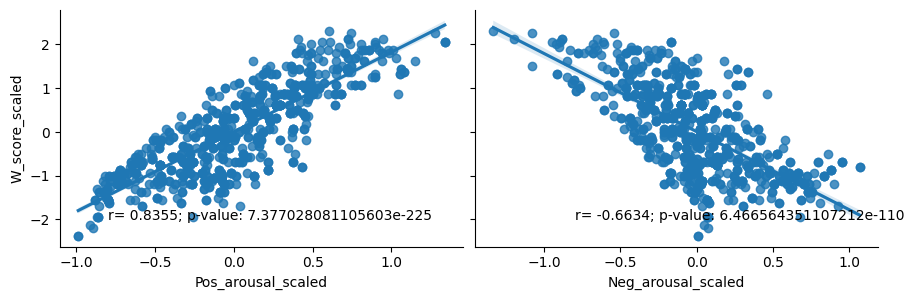

In [10]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for both types of trailers. 
W_PA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Pos_arousal_scaled"])
W_NA_All_corr = pearsonr(all_subs_events_df["W_score_scaled"], all_subs_events_df["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal is: " + str(round(W_PA_All_corr[0], 4)) + " with a p-value of: " + str((W_PA_All_corr[1])))
print("The correlation between W_score and Neg_arousal is: " + str(round(W_NA_All_corr[0], 4)) + " with a p-value of: " + str((W_NA_All_corr[1])))

W_PA_NA_behavioral_plot = sns.pairplot(
    all_subs_events_df,
    kind="reg",
    x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
    y_vars=["W_score_scaled"], 
    palette="crest",
    height=3,
    aspect=1.5)

# Add annotation to the plot. 
W_PA_string = "r= " + str(round(W_PA_All_corr[0], 4)) + "; p-value: " + str((W_PA_All_corr[1]))
W_PA_NA_behavioral_plot.axes[0, 0].text(s=W_PA_string, x=-.8, y=-2, fontsize=10)
W_NA_string = "r= " + str(round(W_NA_All_corr[0], 4)) + "; p-value: " + str((W_NA_All_corr[1]))
W_PA_NA_behavioral_plot.axes[0, 1].text(s=W_NA_string, x=-.8, y=-2, fontsize=10)


In [11]:
# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for comedy trailers.
W_PA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Pos_arousal_scaled"])
W_NA_comedy_corr = pearsonr(all_subs_events_comedy["W_score_scaled"], all_subs_events_comedy["Neg_arousal_scaled"])

print("The correlation between W_score and Pos_arousal for comedy trailers is: " + str(round(W_PA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_PA_comedy_corr[1])))
print("The correlation between W_score and Neg_arousal for comedy trailers is: " + str(round(W_NA_comedy_corr[0], 4)) + " with a p-value of: " + str((W_NA_comedy_corr[1])))

# Correlation between W_score and Pos_arousal and A_score and Pos_arousal for horror trailers.
W_PA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Pos_arousal_scaled"])
W_NA_horror_corr = pearsonr(all_subs_events_horror["W_score_scaled"], all_subs_events_horror["Neg_arousal_scaled"])

print("\nThe correlation between W_score and Pos_arousal for horror trailers is: " + str(round(W_PA_horror_corr[0], 4)) + " with a p-value of: " + str((W_PA_horror_corr[1])))
print("The correlation between W_score and Neg_arousal for horror trailers is: " + str(round(W_NA_horror_corr[0], 4)) + " with a p-value of: " + str((W_NA_horror_corr[1])))


The correlation between W_score and Pos_arousal for comedy trailers is: 0.9078 with a p-value of: 9.004903425277944e-165
The correlation between W_score and Neg_arousal for comedy trailers is: -0.6845 with a p-value of: 3.816481389842055e-61

The correlation between W_score and Pos_arousal for horror trailers is: 0.8016 with a p-value of: 1.514049911082475e-96
The correlation between W_score and Neg_arousal for horror trailers is: -0.6392 with a p-value of: 3.482151848958289e-50


Text(-0.8, -2.5, 'H r= 0.8016; p-value: 1.514049911082475e-96')

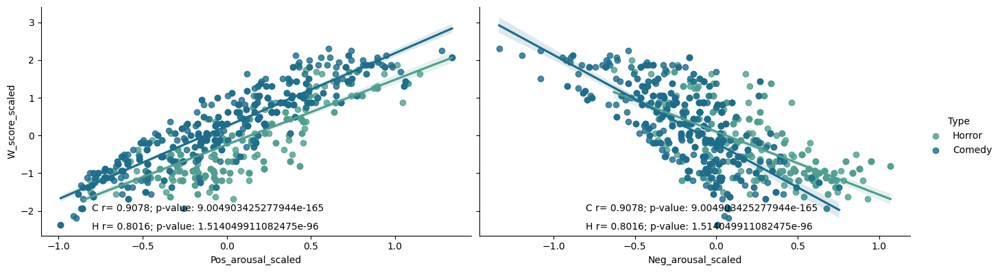

In [12]:
W_PA_NA_bothTrailers_behavioral_plot = sns.pairplot(
    all_subs_events_df,
    kind="reg",
    x_vars=["Pos_arousal_scaled", "Neg_arousal_scaled"],
    y_vars=["W_score_scaled"], 
    palette="crest",
    hue="Type",
    height=4,
    aspect=1.7)

W_comedy_PA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_PA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_comedy_PA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 0].text(s=W_horror_PA_string, x=-.8, y=-2.5, fontsize=10)

W_comedy_NA_string = "C r= " + str(round(W_PA_comedy_corr[0], 4)) + "; p-value: " + str((W_PA_comedy_corr[1]))
W_horror_NA_string = "H r= " + str(round(W_PA_horror_corr[0], 4)) + "; p-value: " + str((W_PA_horror_corr[1]))
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_comedy_NA_string, x=-.8, y=-2, fontsize=10)
W_PA_NA_bothTrailers_behavioral_plot.axes[0, 1].text(s=W_horror_NA_string, x=-.8, y=-2.5, fontsize=10)

<Axes: xlabel='Type', ylabel='Neg_arousal_scaled'>

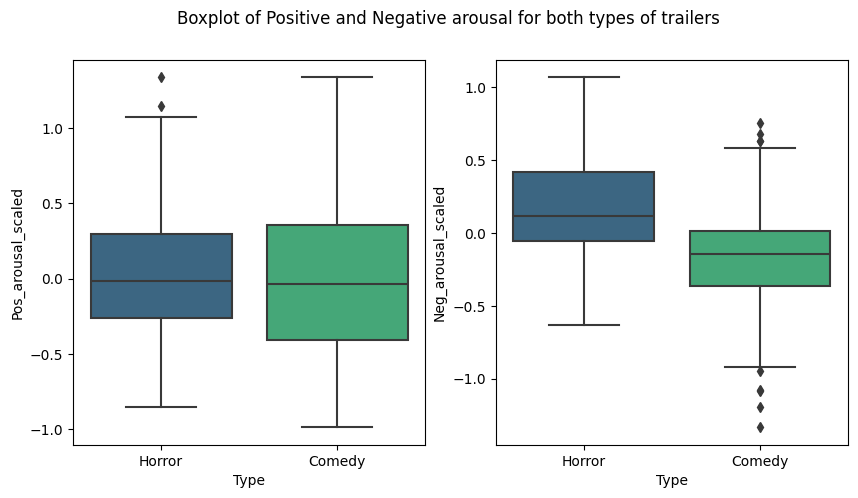

In [13]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5), sharex=True)
fig.suptitle("Boxplot of Positive and Negative arousal for both types of trailers")
sns.boxplot(data=all_subs_events_df, y="Pos_arousal_scaled", x="Type", palette="viridis", ax=axs[0])
sns.boxplot(data=all_subs_events_df, y="Neg_arousal_scaled", x="Type", palette="viridis", ax=axs[1])


<Axes: xlabel='Pos_arousal_scaled', ylabel='Count'>

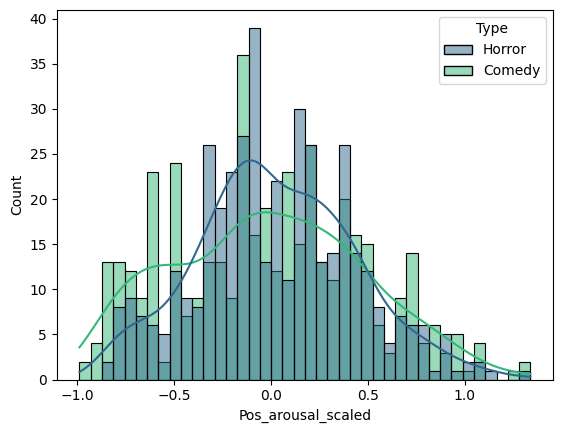

In [14]:
sns.histplot(data=all_subs_events_df, x="Pos_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)
#sns.histplot(data=all_subs_events_df, x="Neg_arousal_scaled", hue="Type", kde=True, palette="viridis", bins=40)



<Axes: xlabel='W_score_scaled', ylabel='Count'>

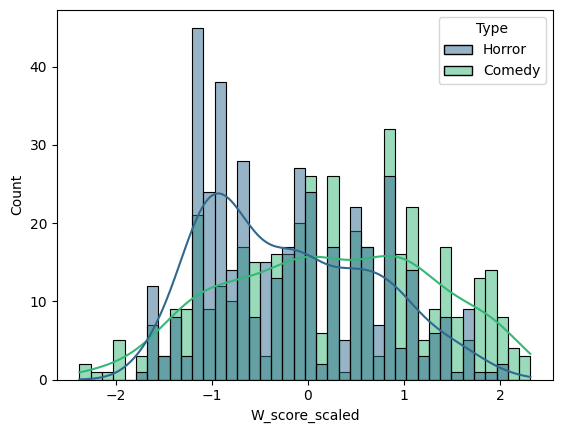

In [15]:
sns.histplot(data=all_subs_events_df, x="W_score_scaled", hue="Type", kde=True, palette="viridis", bins=40)

In [54]:
#sns.displot(data=all_subs_events_df, x="W_score", row="Trailer", kde=True, palette="viridis")

## Neural Activation Whole Average 

In [17]:
# Correlation with Positive Arousal. 
NAcc_PA_whole_All_corr = pearsonr(all_subs_events_df["NAcc_whole"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_whole_All_corr = pearsonr(all_subs_events_df["AIns_whole"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_whole_All_corr = pearsonr(all_subs_events_df["MPFC_whole"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_whole_All_corr = pearsonr(all_subs_events_df["NAcc_whole"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_whole_All_corr = pearsonr(all_subs_events_df["AIns_whole"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_whole_All_corr = pearsonr(all_subs_events_df["MPFC_whole"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores. 
NAcc_W_whole_All_corr = pearsonr(all_subs_events_df["NAcc_whole"], all_subs_events_df["W_score_scaled"])
AIns_W_whole_All_corr = pearsonr(all_subs_events_df["AIns_whole"], all_subs_events_df["W_score_scaled"])
MPFC_W_whole_All_corr = pearsonr(all_subs_events_df["MPFC_whole"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc whole activation and positive arousal is: " + str(round(NAcc_PA_whole_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_whole_All_corr[1])))
print("For both types of trailers, the correlation between AIns whole activation and positive arousal is: " + str(round(AIns_PA_whole_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_whole_All_corr[1])))
print("For both types of trailers, the correlation between MPFC whole activation and positive arousal is: " + str(round(MPFC_PA_whole_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_whole_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc whole activation and negative arousal is: " + str(round(NAcc_NA_whole_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_whole_All_corr[1])))
print("For both types of trailers, the correlation between AIns whole activation and negative arousal is: " + str(round(AIns_NA_whole_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_whole_All_corr[1])))
print("For both types of trailers, the correlation between MPFC whole activation and negative arousal is: " + str(round(MPFC_NA_whole_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_whole_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc whole activation and watch scores is: " + str(round(NAcc_W_whole_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_whole_All_corr[1])))
print("For both types of trailers, the correlation between AIns whole activation and watch scores is: " + str(round(AIns_W_whole_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_whole_All_corr[1])))
print("For both types of trailers, the correlation between MPFC whole activation and watch scores is: " + str(round(MPFC_W_whole_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_whole_All_corr[1])))


For both types of trailers, the correlation between NAcc whole activation and positive arousal is: 0.05224 with a p-value of: 0.12625638281814927
For both types of trailers, the correlation between AIns whole activation and positive arousal is: 0.07272 with a p-value of: 0.033193886704824635
For both types of trailers, the correlation between MPFC whole activation and positive arousal is: -0.01878 with a p-value of: 0.5827475840863122

For both types of trailers, the correlation between NAcc whole activation and negative arousal is: 0.0081 with a p-value of: 0.8127956788622951
For both types of trailers, the correlation between AIns whole activation and negative arousal is: 0.15537 with a p-value of: 4.828722131216893e-06
For both types of trailers, the correlation between MPFC whole activation and negative arousal is: -0.02407 with a p-value of: 0.481361933232584

For both types of trailers, the correlation between NAcc whole activation and watch scores is: 0.0343 with a p-value of: 0

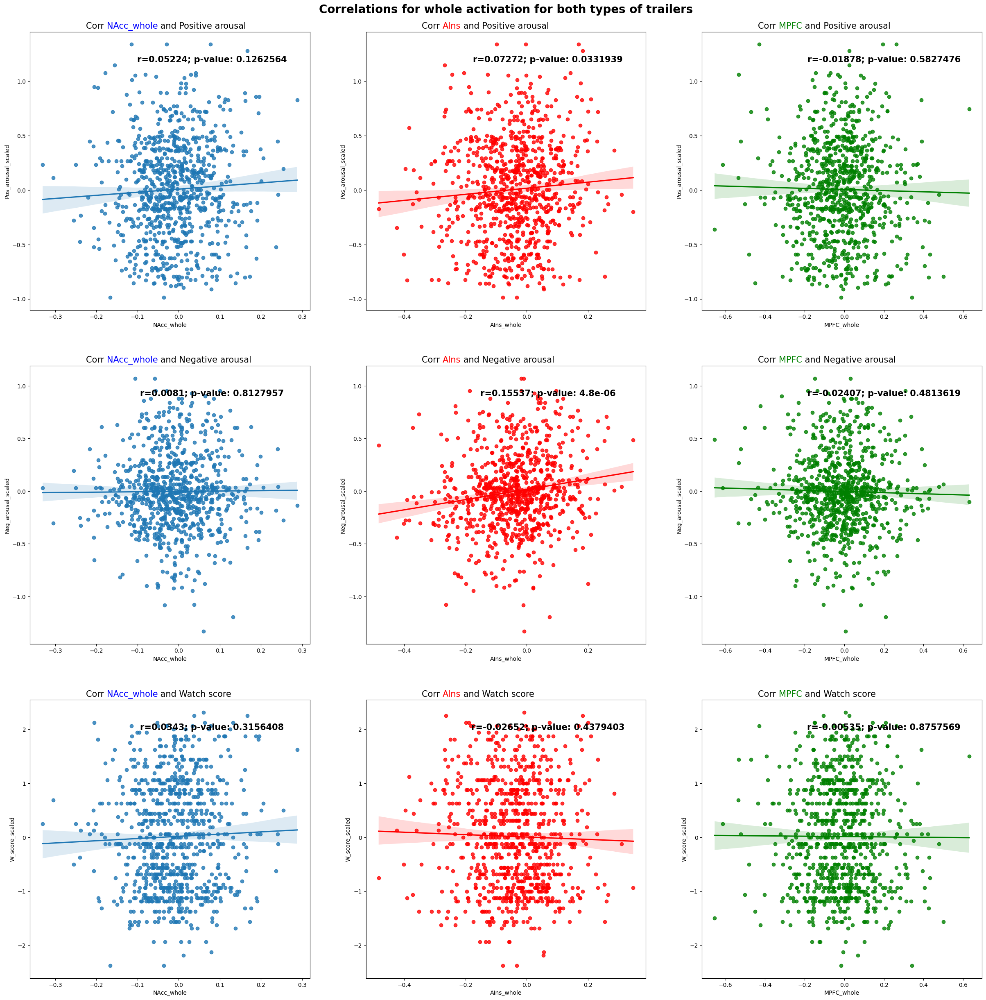

In [18]:
whole_all_corr = [NAcc_PA_whole_All_corr, NAcc_NA_whole_All_corr, NAcc_W_whole_All_corr, AIns_PA_whole_All_corr, AIns_NA_whole_All_corr, AIns_W_whole_All_corr, MPFC_PA_whole_All_corr, MPFC_NA_whole_All_corr, MPFC_W_whole_All_corr]

plot_correlations(all_subs_events_df, whole_all_corr, "whole", "Correlations for whole activation for both types of trailers")

In [19]:
# Whole Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_whole_C_corr = pearsonr(all_subs_events_comedy["NAcc_whole"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_whole_C_corr = pearsonr(all_subs_events_comedy["AIns_whole"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_whole_C_corr = pearsonr(all_subs_events_comedy["MPFC_whole"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_whole_C_corr = pearsonr(all_subs_events_comedy["NAcc_whole"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_whole_C_corr = pearsonr(all_subs_events_comedy["AIns_whole"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_whole_C_corr = pearsonr(all_subs_events_comedy["MPFC_whole"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_whole_C_corr = pearsonr(all_subs_events_comedy["NAcc_whole"], all_subs_events_comedy["W_score_scaled"])
AIns_W_whole_C_corr = pearsonr(all_subs_events_comedy["AIns_whole"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_whole_C_corr = pearsonr(all_subs_events_comedy["MPFC_whole"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc whole activation and positive arousal is: " + str(round(NAcc_PA_whole_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_whole_C_corr[1])))
print("For comedy trailers, the correlation between AIns whole activation and positive arousal is: " + str(round(AIns_PA_whole_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_whole_C_corr[1])))
print("For comedy trailers, the correlation between MPFC whole activation and positive arousal is: " + str(round(MPFC_PA_whole_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_whole_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc whole activation and negative arousal is: " + str(round(NAcc_NA_whole_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_whole_C_corr[1])))
print("For comedy trailers, the correlation between AIns whole activation and negative arousal is: " + str(round(AIns_NA_whole_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_whole_C_corr[1])))
print("For comedy trailers, the correlation between MPFC whole activation and negative arousal is: " + str(round(MPFC_NA_whole_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_whole_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc whole activation and watch scores is: " + str(round(NAcc_W_whole_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_whole_C_corr[1])))
print("For comedy trailers, the correlation between AIns whole activation and watch scores is: " + str(round(AIns_W_whole_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_whole_C_corr[1])))
print("For comedy trailers, the correlation between MPFC whole activation and watch scores is: " + str(round(MPFC_W_whole_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_whole_C_corr[1])))
      
      

For comedy trailers, the correlation between NAcc whole activation and positive arousal is: 0.06102 with a p-value of: 0.20508025093905377
For comedy trailers, the correlation between AIns whole activation and positive arousal is: 0.09064 with a p-value of: 0.059491555951890394
For comedy trailers, the correlation between MPFC whole activation and positive arousal is: -0.01664 with a p-value of: 0.7298867361364851

For comedy trailers, the correlation between NAcc whole activation and negative arousal is: -0.02213 with a p-value of: 0.646040895171935
For comedy trailers, the correlation between AIns whole activation and negative arousal is: 0.05353 with a p-value of: 0.26637026251818247
For comedy trailers, the correlation between MPFC whole activation and negative arousal is: 0.00988 with a p-value of: 0.8376032779794942

For comedy trailers, the correlation between NAcc whole activation and watch scores is: 0.04834 with a p-value of: 0.31561395065260894
For comedy trailers, the corre

In [20]:
# Whole Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_whole_H_corr = pearsonr(all_subs_events_horror["NAcc_whole"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_whole_H_corr = pearsonr(all_subs_events_horror["AIns_whole"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_whole_H_corr = pearsonr(all_subs_events_horror["MPFC_whole"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_whole_H_corr = pearsonr(all_subs_events_horror["NAcc_whole"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_whole_H_corr = pearsonr(all_subs_events_horror["AIns_whole"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_whole_H_corr = pearsonr(all_subs_events_horror["MPFC_whole"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_whole_H_corr = pearsonr(all_subs_events_horror["NAcc_whole"], all_subs_events_horror["W_score_scaled"])
AIns_W_whole_H_corr = pearsonr(all_subs_events_horror["AIns_whole"], all_subs_events_horror["W_score_scaled"])
MPFC_W_whole_H_corr = pearsonr(all_subs_events_horror["MPFC_whole"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc whole activation and positive arousal is: " + str(round(NAcc_PA_whole_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_whole_H_corr[1])))
print("For horror trailers, the correlation between AIns whole activation and positive arousal is: " + str(round(AIns_PA_whole_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_whole_H_corr[1])))
print("For horror trailers, the correlation between MPFC whole activation and positive arousal is: " + str(round(MPFC_PA_whole_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_whole_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc whole activation and negative arousal is: " + str(round(NAcc_NA_whole_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_whole_H_corr[1])))
print("For horror trailers, the correlation between AIns whole activation and negative arousal is: " + str(round(AIns_NA_whole_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_whole_H_corr[1])))
print("For horror trailers, the correlation between MPFC whole activation and negative arousal is: " + str(round(MPFC_NA_whole_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_whole_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc whole activation and watch scores is: " + str(round(NAcc_W_whole_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_whole_H_corr[1])))
print("For horror trailers, the correlation between AIns whole activation and watch scores is: " + str(round(AIns_W_whole_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_whole_H_corr[1])))
print("For horror trailers, the correlation between MPFC whole activation and watch scores is: " + str(round(MPFC_W_whole_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_whole_H_corr[1])))



For horror trailers, the correlation between NAcc whole activation and positive arousal is: 0.03991 with a p-value of: 0.41185683389917654
For horror trailers, the correlation between AIns whole activation and positive arousal is: 0.03027 with a p-value of: 0.5336877498330198
For horror trailers, the correlation between MPFC whole activation and positive arousal is: -0.01974 with a p-value of: 0.6848274423453802

For horror trailers, the correlation between NAcc whole activation and negative arousal is: 0.02329 with a p-value of: 0.6321119144354982
For horror trailers, the correlation between AIns whole activation and negative arousal is: 0.06968 with a p-value of: 0.15157863493016377
For horror trailers, the correlation between MPFC whole activation and negative arousal is: -0.04319 with a p-value of: 0.3743959662124892

For horror trailers, the correlation between NAcc whole activation and watch scores is: 0.02578 with a p-value of: 0.5961778772198894
For horror trailers, the correla

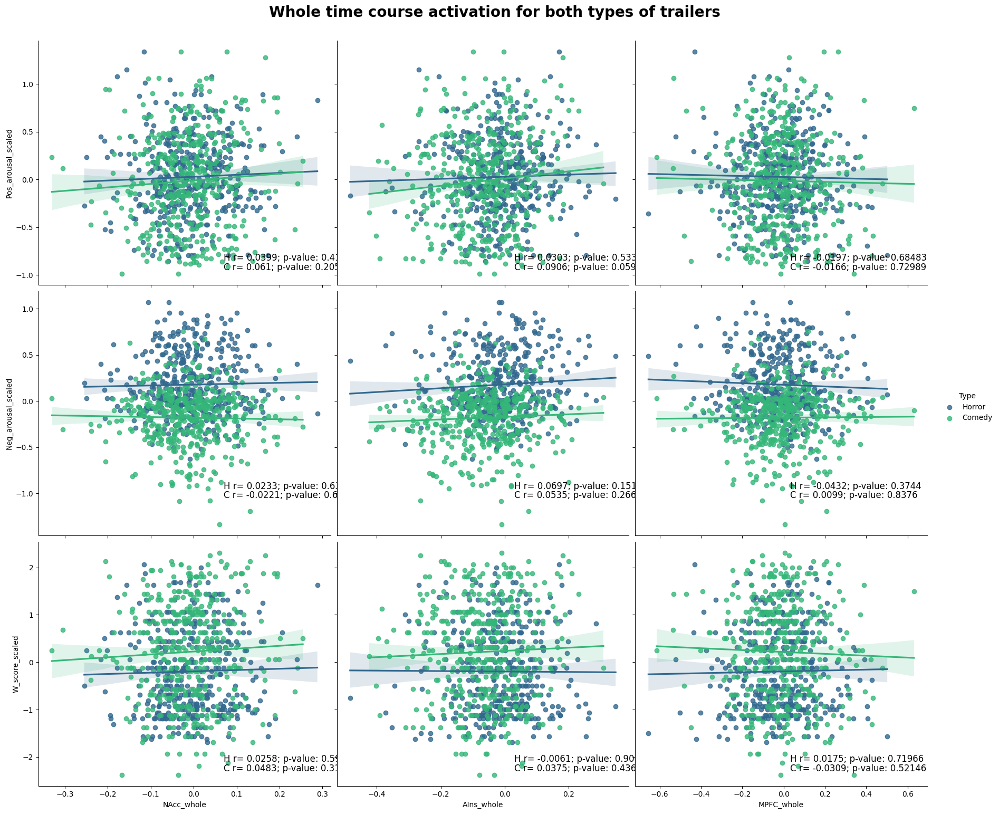

In [21]:
whole_comedy_corr = [NAcc_PA_whole_C_corr, NAcc_NA_whole_C_corr, NAcc_W_whole_C_corr, AIns_PA_whole_C_corr, AIns_NA_whole_C_corr, AIns_W_whole_C_corr, MPFC_PA_whole_C_corr, MPFC_NA_whole_C_corr, MPFC_W_whole_C_corr]
whole_horror_corr = [NAcc_PA_whole_H_corr, NAcc_NA_whole_H_corr, NAcc_W_whole_H_corr, AIns_PA_whole_H_corr, AIns_NA_whole_H_corr, AIns_W_whole_H_corr, MPFC_PA_whole_H_corr, MPFC_NA_whole_H_corr, MPFC_W_whole_H_corr]

title_whole = 'Whole time course activation for both types of trailers'
plot_correlations3_bothTrailers(all_subs_events_df, "whole", whole_comedy_corr, whole_horror_corr, title_whole)

## Neural Activation Offset 

In [22]:
# Correlation with Positive Arousal. 
NAcc_PA_Off_All_corr = pearsonr(all_subs_events_df["NAcc_offset"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Off_All_corr = pearsonr(all_subs_events_df["AIns_offset"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Off_All_corr = pearsonr(all_subs_events_df["MPFC_offset"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Off_All_corr = pearsonr(all_subs_events_df["NAcc_offset"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Off_All_corr = pearsonr(all_subs_events_df["AIns_offset"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Off_All_corr = pearsonr(all_subs_events_df["MPFC_offset"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Off_All_corr = pearsonr(all_subs_events_df["NAcc_offset"], all_subs_events_df["W_score_scaled"])
AIns_W_Off_All_corr = pearsonr(all_subs_events_df["AIns_offset"], all_subs_events_df["W_score_scaled"])
MPFC_W_Off_All_corr = pearsonr(all_subs_events_df["MPFC_offset"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc offset activation and positive arousal is: " + str(round(NAcc_PA_Off_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Off_All_corr[1])))
print("For both types of trailers, the correlation between AIns offset activation and positive arousal is: " + str(round(AIns_PA_Off_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Off_All_corr[1])))
print("For both types of trailers, the correlation between MPFC offset activation and positive arousal is: " + str(round(MPFC_PA_Off_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Off_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc offset activation and negative arousal is: " + str(round(NAcc_NA_Off_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Off_All_corr[1])))
print("For both types of trailers, the correlation between AIns offset activation and negative arousal is: " + str(round(AIns_NA_Off_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Off_All_corr[1])))
print("For both types of trailers, the correlation between MPFC offset activation and negative arousal is: " + str(round(MPFC_NA_Off_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Off_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc offset activation and watch scores is: " + str(round(NAcc_W_Off_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Off_All_corr[1])))
print("For both types of trailers, the correlation between AIns offset activation and watch scores is: " + str(round(AIns_W_Off_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Off_All_corr[1])))
print("For both types of trailers, the correlation between MPFC offset activation and watch scores is: " + str(round(MPFC_W_Off_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Off_All_corr[1])))

For both types of trailers, the correlation between NAcc offset activation and positive arousal is: 0.03431 with a p-value of: 0.31546864979492845
For both types of trailers, the correlation between AIns offset activation and positive arousal is: 0.02453 with a p-value of: 0.47295855361617484
For both types of trailers, the correlation between MPFC offset activation and positive arousal is: -0.00853 with a p-value of: 0.8029901847736702

For both types of trailers, the correlation between NAcc offset activation and negative arousal is: -0.0369 with a p-value of: 0.2803465043478947
For both types of trailers, the correlation between AIns offset activation and negative arousal is: 0.11187 with a p-value of: 0.0010288462460040291
For both types of trailers, the correlation between MPFC offset activation and negative arousal is: -0.0313 with a p-value of: 0.35988639574140496

For both types of trailers, the correlation between NAcc offset activation and watch scores is: 0.03694 with a p-va

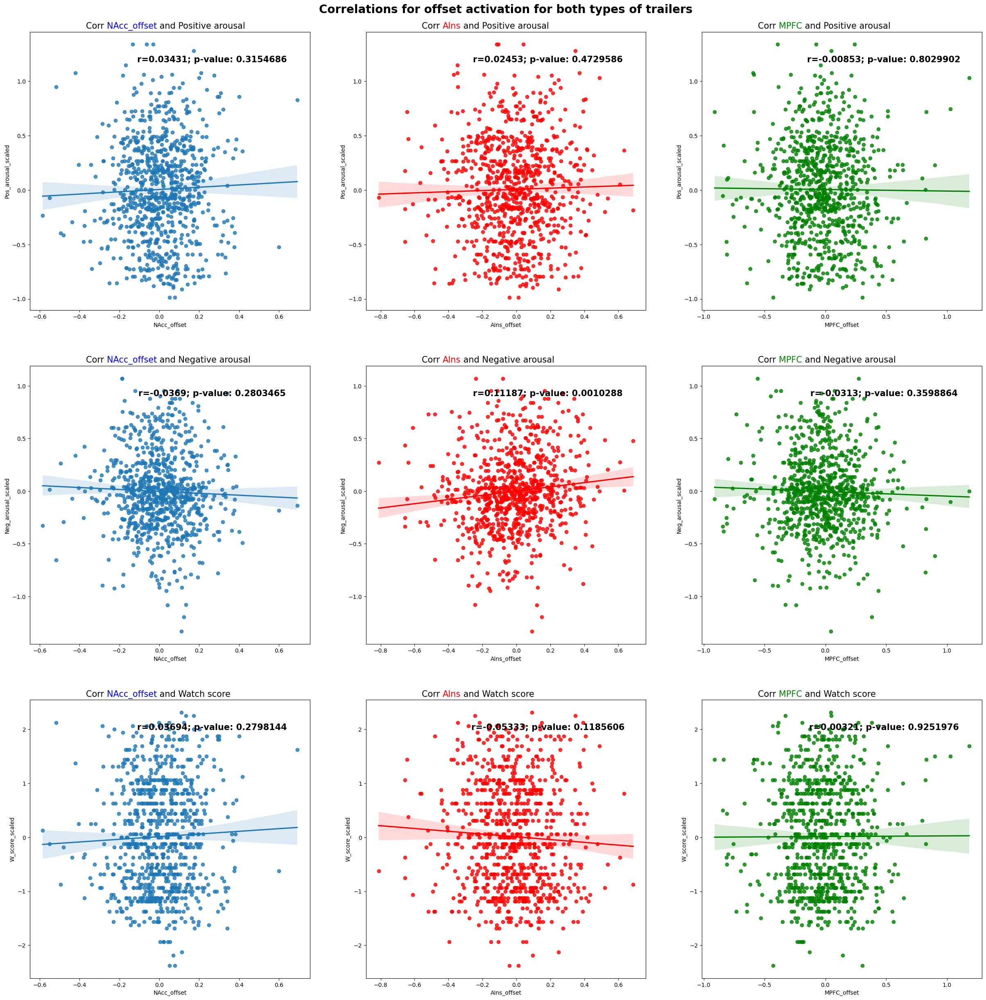

In [23]:
offset_all_corr = [NAcc_PA_Off_All_corr, NAcc_NA_Off_All_corr, NAcc_W_Off_All_corr, AIns_PA_Off_All_corr, AIns_NA_Off_All_corr, AIns_W_Off_All_corr, MPFC_PA_Off_All_corr, MPFC_NA_Off_All_corr, MPFC_W_Off_All_corr]
plot_correlations(all_subs_events_df, offset_all_corr, "offset", "Correlations for offset activation for both types of trailers")

In [24]:
# Offset Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Off_C_corr = pearsonr(all_subs_events_comedy["NAcc_offset"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Off_C_corr = pearsonr(all_subs_events_comedy["AIns_offset"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Off_C_corr = pearsonr(all_subs_events_comedy["MPFC_offset"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Off_C_corr = pearsonr(all_subs_events_comedy["NAcc_offset"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Off_C_corr = pearsonr(all_subs_events_comedy["AIns_offset"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Off_C_corr = pearsonr(all_subs_events_comedy["MPFC_offset"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Off_C_corr = pearsonr(all_subs_events_comedy["NAcc_offset"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Off_C_corr = pearsonr(all_subs_events_comedy["AIns_offset"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Off_C_corr = pearsonr(all_subs_events_comedy["MPFC_offset"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc offset activation and positive arousal is: " + str(round(NAcc_PA_Off_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Off_C_corr[1])))
print("For comedy trailers, the correlation between AIns offset activation and positive arousal is: " + str(round(AIns_PA_Off_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Off_C_corr[1])))
print("For comedy trailers, the correlation between MPFC offset activation and positive arousal is: " + str(round(MPFC_PA_Off_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Off_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc offset activation and negative arousal is: " + str(round(NAcc_NA_Off_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Off_C_corr[1])))
print("For comedy trailers, the correlation between AIns offset activation and negative arousal is: " + str(round(AIns_NA_Off_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Off_C_corr[1])))
print("For comedy trailers, the correlation between MPFC offset activation and negative arousal is: " + str(round(MPFC_NA_Off_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Off_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc offset activation and watch scores is: " + str(round(NAcc_W_Off_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Off_C_corr[1])))
print("For comedy trailers, the correlation between AIns offset activation and watch scores is: " + str(round(AIns_W_Off_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Off_C_corr[1])))
print("For comedy trailers, the correlation between MPFC offset activation and watch scores is: " + str(round(MPFC_W_Off_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Off_C_corr[1])))
      

For comedy trailers, the correlation between NAcc offset activation and positive arousal is: -0.02841 with a p-value of: 0.555534875446367
For comedy trailers, the correlation between AIns offset activation and positive arousal is: 0.0238 with a p-value of: 0.6214206111894768
For comedy trailers, the correlation between MPFC offset activation and positive arousal is: -0.008 with a p-value of: 0.8681671436679844

For comedy trailers, the correlation between NAcc offset activation and negative arousal is: -0.01928 with a p-value of: 0.6890579189332959
For comedy trailers, the correlation between AIns offset activation and negative arousal is: 0.00937 with a p-value of: 0.845824126774732
For comedy trailers, the correlation between MPFC offset activation and negative arousal is: 0.01551 with a p-value of: 0.7476390477391165

For comedy trailers, the correlation between NAcc offset activation and watch scores is: -0.02202 with a p-value of: 0.6477875114347841
For comedy trailers, the corre

In [25]:
# Offset Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Off_H_corr = pearsonr(all_subs_events_horror["NAcc_offset"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Off_H_corr = pearsonr(all_subs_events_horror["AIns_offset"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Off_H_corr = pearsonr(all_subs_events_horror["MPFC_offset"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Off_H_corr = pearsonr(all_subs_events_horror["NAcc_offset"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Off_H_corr = pearsonr(all_subs_events_horror["AIns_offset"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Off_H_corr = pearsonr(all_subs_events_horror["MPFC_offset"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Off_H_corr = pearsonr(all_subs_events_horror["NAcc_offset"], all_subs_events_horror["W_score_scaled"])
AIns_W_Off_H_corr = pearsonr(all_subs_events_horror["AIns_offset"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Off_H_corr = pearsonr(all_subs_events_horror["MPFC_offset"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc offset activation and positive arousal is: " + str(round(NAcc_PA_Off_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Off_H_corr[1])))
print("For horror trailers, the correlation between AIns offset activation and positive arousal is: " + str(round(AIns_PA_Off_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Off_H_corr[1])))
print("For horror trailers, the correlation between MPFC offset activation and positive arousal is: " + str(round(MPFC_PA_Off_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Off_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc offset activation and negative arousal is: " + str(round(NAcc_NA_Off_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Off_H_corr[1])))
print("For horror trailers, the correlation between AIns offset activation and negative arousal is: " + str(round(AIns_NA_Off_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Off_H_corr[1])))
print("For horror trailers, the correlation between MPFC offset activation and negative arousal is: " + str(round(MPFC_NA_Off_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Off_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc offset activation and watch scores is: " + str(round(NAcc_W_Off_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Off_H_corr[1])))
print("For horror trailers, the correlation between AIns offset activation and watch scores is: " + str(round(AIns_W_Off_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Off_H_corr[1])))
print("For horror trailers, the correlation between MPFC offset activation and watch scores is: " + str(round(MPFC_W_Off_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Off_H_corr[1])))

For horror trailers, the correlation between NAcc offset activation and positive arousal is: 0.11283 with a p-value of: 0.0199889020378797
For horror trailers, the correlation between AIns offset activation and positive arousal is: 0.01438 with a p-value of: 0.7674645023623758
For horror trailers, the correlation between MPFC offset activation and positive arousal is: -0.00791 with a p-value of: 0.8709064802852711

For horror trailers, the correlation between NAcc offset activation and negative arousal is: -0.03032 with a p-value of: 0.5330158646706018
For horror trailers, the correlation between AIns offset activation and negative arousal is: 0.104 with a p-value of: 0.032070016773096066
For horror trailers, the correlation between MPFC offset activation and negative arousal is: -0.07872 with a p-value of: 0.10509524777001195

For horror trailers, the correlation between NAcc offset activation and watch scores is: 0.09456 with a p-value of: 0.05141691361645132
For horror trailers, the

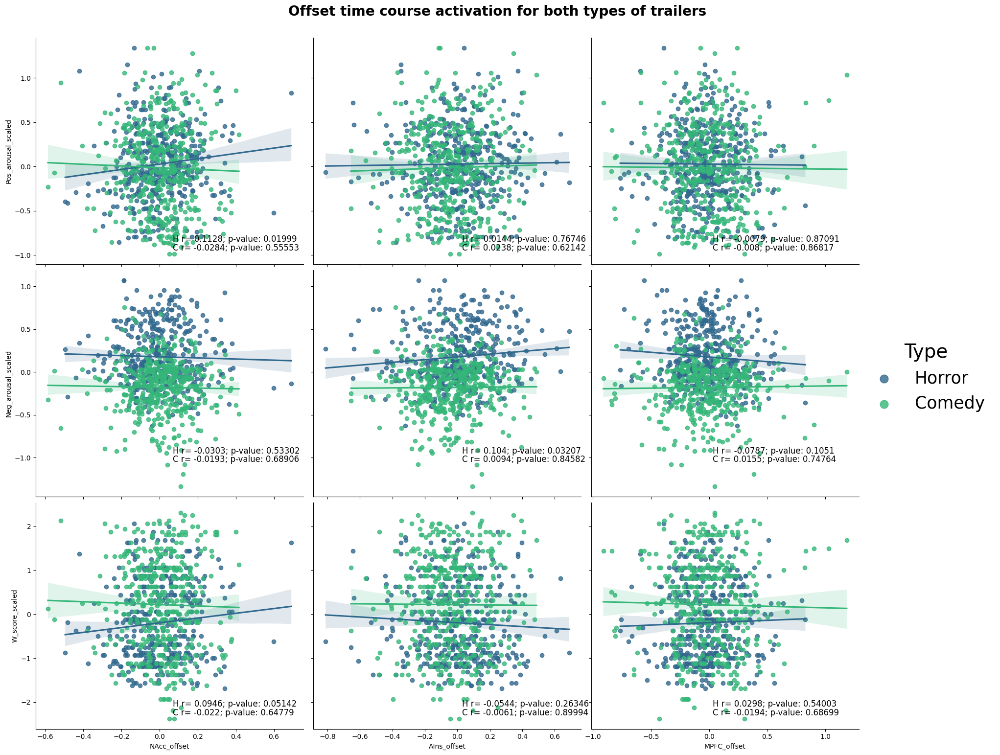

In [26]:
offset_horror_corr = [NAcc_PA_Off_H_corr, NAcc_NA_Off_H_corr, NAcc_W_Off_H_corr, AIns_PA_Off_H_corr, AIns_NA_Off_H_corr, AIns_W_Off_H_corr, MPFC_PA_Off_H_corr, MPFC_NA_Off_H_corr, MPFC_W_Off_H_corr]
offset_comedy_corr = [NAcc_PA_Off_C_corr, NAcc_NA_Off_C_corr, NAcc_W_Off_C_corr, AIns_PA_Off_C_corr, AIns_NA_Off_C_corr, AIns_W_Off_C_corr, MPFC_PA_Off_C_corr, MPFC_NA_Off_C_corr, MPFC_W_Off_C_corr]

title_offset = 'Offset time course activation for both types of trailers'
plot_correlations3_bothTrailers(all_subs_events_df, "offset", offset_comedy_corr, offset_horror_corr, title_offset)


# Neural activation middle

In [27]:
# Correlation with Positive Arousal.
NAcc_PA_Mid_All_corr = pearsonr(all_subs_events_df["NAcc_middle"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Mid_All_corr = pearsonr(all_subs_events_df["AIns_middle"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Mid_All_corr = pearsonr(all_subs_events_df["MPFC_middle"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Mid_All_corr = pearsonr(all_subs_events_df["NAcc_middle"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Mid_All_corr = pearsonr(all_subs_events_df["AIns_middle"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Mid_All_corr = pearsonr(all_subs_events_df["MPFC_middle"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Mid_All_corr = pearsonr(all_subs_events_df["NAcc_middle"], all_subs_events_df["W_score_scaled"])
AIns_W_Mid_All_corr = pearsonr(all_subs_events_df["AIns_middle"], all_subs_events_df["W_score_scaled"])
MPFC_W_Mid_All_corr = pearsonr(all_subs_events_df["MPFC_middle"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc middle activation and positive arousal is: " + str(round(NAcc_PA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between AIns middle activation and positive arousal is: " + str(round(AIns_PA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between MPFC middle activation and positive arousal is: " + str(round(MPFC_PA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Mid_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc middle activation and negative arousal is: " + str(round(NAcc_NA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between AIns middle activation and negative arousal is: " + str(round(AIns_NA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Mid_All_corr[1])))
print("For both types of trailers, the correlation between MPFC middle activation and negative arousal is: " + str(round(MPFC_NA_Mid_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Mid_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc middle activation and watch scores is: " + str(round(NAcc_W_Mid_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Mid_All_corr[1])))
print("For both types of trailers, the correlation between AIns middle activation and watch scores is: " + str(round(AIns_W_Mid_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Mid_All_corr[1])))
print("For both types of trailers, the correlation between MPFC middle activation and watch scores is: " + str(round(MPFC_W_Mid_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Mid_All_corr[1])))
      


For both types of trailers, the correlation between NAcc middle activation and positive arousal is: 0.00579 with a p-value of: 0.8654232263061197
For both types of trailers, the correlation between AIns middle activation and positive arousal is: 0.04155 with a p-value of: 0.2240981259876373
For both types of trailers, the correlation between MPFC middle activation and positive arousal is: -0.04234 with a p-value of: 0.2153596724553525

For both types of trailers, the correlation between NAcc middle activation and negative arousal is: 0.01788 with a p-value of: 0.6010370334093634
For both types of trailers, the correlation between AIns middle activation and negative arousal is: 0.11233 with a p-value of: 0.00098043378464775
For both types of trailers, the correlation between MPFC middle activation and negative arousal is: -0.0216 with a p-value of: 0.5274485156131256

For both types of trailers, the correlation between NAcc middle activation and watch scores is: -0.00041 with a p-value 

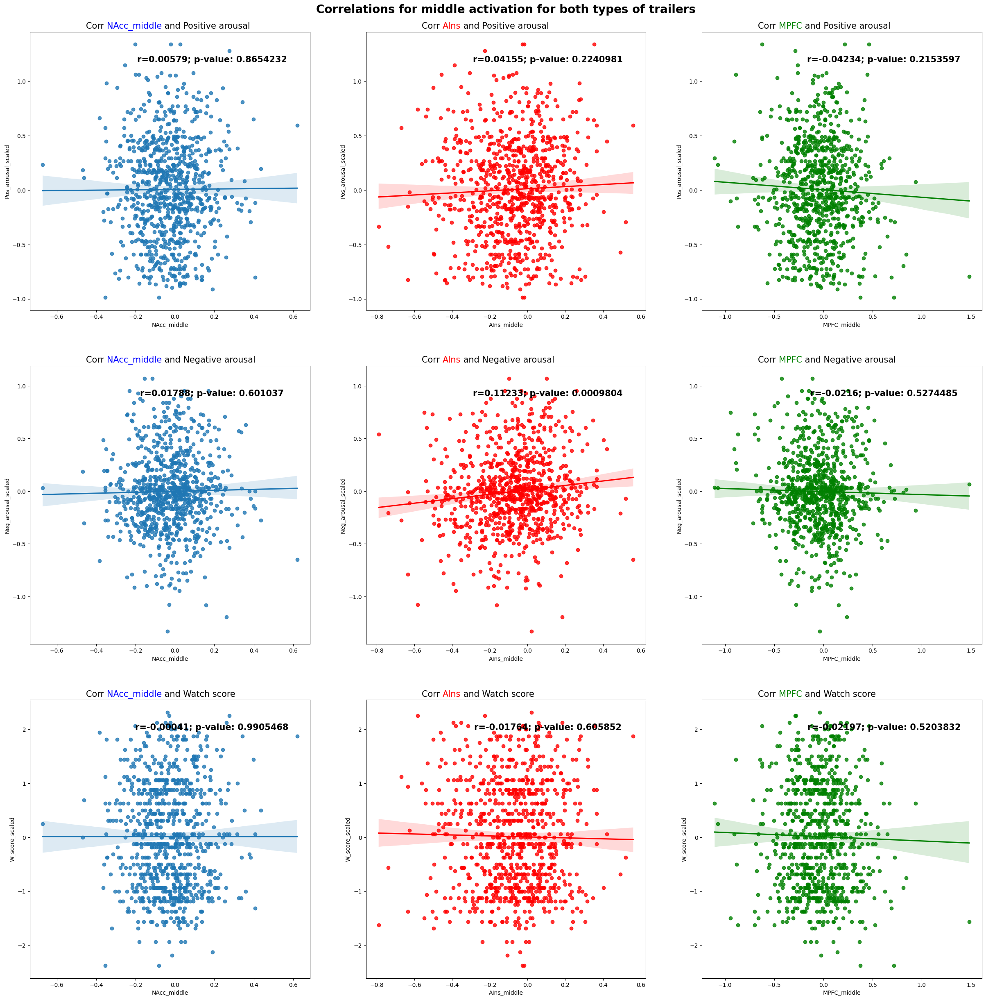

In [28]:
Mid_all_corr = [NAcc_PA_Mid_All_corr, NAcc_NA_Mid_All_corr, NAcc_W_Mid_All_corr, AIns_PA_Mid_All_corr, AIns_NA_Mid_All_corr, AIns_W_Mid_All_corr, MPFC_PA_Mid_All_corr, MPFC_NA_Mid_All_corr, MPFC_W_Mid_All_corr]
plot_correlations(all_subs_events_df, Mid_all_corr, "middle", "Correlations for middle activation for both types of trailers")

In [29]:
# Middle Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Mid_C_corr = pearsonr(all_subs_events_comedy["NAcc_middle"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Mid_C_corr = pearsonr(all_subs_events_comedy["AIns_middle"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Mid_C_corr = pearsonr(all_subs_events_comedy["MPFC_middle"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Mid_C_corr = pearsonr(all_subs_events_comedy["NAcc_middle"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Mid_C_corr = pearsonr(all_subs_events_comedy["AIns_middle"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Mid_C_corr = pearsonr(all_subs_events_comedy["MPFC_middle"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Mid_C_corr = pearsonr(all_subs_events_comedy["NAcc_middle"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Mid_C_corr = pearsonr(all_subs_events_comedy["AIns_middle"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Mid_C_corr = pearsonr(all_subs_events_comedy["MPFC_middle"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc middle activation and positive arousal is: " + str(round(NAcc_PA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between AIns middle activation and positive arousal is: " + str(round(AIns_PA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between MPFC middle activation and positive arousal is: " + str(round(MPFC_PA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Mid_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc middle activation and negative arousal is: " + str(round(NAcc_NA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between AIns middle activation and negative arousal is: " + str(round(AIns_NA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Mid_C_corr[1])))
print("For comedy trailers, the correlation between MPFC middle activation and negative arousal is: " + str(round(MPFC_NA_Mid_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Mid_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc middle activation and watch scores is: " + str(round(NAcc_W_Mid_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Mid_C_corr[1])))
print("For comedy trailers, the correlation between AIns middle activation and watch scores is: " + str(round(AIns_W_Mid_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Mid_C_corr[1])))
print("For comedy trailers, the correlation between MPFC middle activation and watch scores is: " + str(round(MPFC_W_Mid_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Mid_C_corr[1])))


For comedy trailers, the correlation between NAcc middle activation and positive arousal is: 0.00195 with a p-value of: 0.9677027015669828
For comedy trailers, the correlation between AIns middle activation and positive arousal is: 0.02318 with a p-value of: 0.6305687302339218
For comedy trailers, the correlation between MPFC middle activation and positive arousal is: -0.03235 with a p-value of: 0.5020273179692019

For comedy trailers, the correlation between NAcc middle activation and negative arousal is: -0.03664 with a p-value of: 0.44690937037570294
For comedy trailers, the correlation between AIns middle activation and negative arousal is: 0.07074 with a p-value of: 0.1416928492836378
For comedy trailers, the correlation between MPFC middle activation and negative arousal is: -0.04944 with a p-value of: 0.30467368371601816

For comedy trailers, the correlation between NAcc middle activation and watch scores is: 0.01717 with a p-value of: 0.7216834669865594
For comedy trailers, the

In [30]:
# Middle Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Mid_H_corr = pearsonr(all_subs_events_horror["NAcc_middle"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Mid_H_corr = pearsonr(all_subs_events_horror["AIns_middle"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Mid_H_corr = pearsonr(all_subs_events_horror["MPFC_middle"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Mid_H_corr = pearsonr(all_subs_events_horror["NAcc_middle"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Mid_H_corr = pearsonr(all_subs_events_horror["AIns_middle"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Mid_H_corr = pearsonr(all_subs_events_horror["MPFC_middle"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Mid_H_corr = pearsonr(all_subs_events_horror["NAcc_middle"], all_subs_events_horror["W_score_scaled"])
AIns_W_Mid_H_corr = pearsonr(all_subs_events_horror["AIns_middle"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Mid_H_corr = pearsonr(all_subs_events_horror["MPFC_middle"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc middle activation and positive arousal is: " + str(round(NAcc_PA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Mid_H_corr[1])))
print("For horror trailers, the correlation between AIns middle activation and positive arousal is: " + str(round(AIns_PA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Mid_H_corr[1])))
print("For horror trailers, the correlation between MPFC middle activation and positive arousal is: " + str(round(MPFC_PA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Mid_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc middle activation and negative arousal is: " + str(round(NAcc_NA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Mid_H_corr[1])))
print("For horror trailers, the correlation between AIns middle activation and negative arousal is: " + str(round(AIns_NA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Mid_H_corr[1])))
print("For horror trailers, the correlation between MPFC middle activation and negative arousal is: " + str(round(MPFC_NA_Mid_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Mid_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc middle activation and watch scores is: " + str(round(NAcc_W_Mid_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Mid_H_corr[1])))
print("For horror trailers, the correlation between AIns middle activation and watch scores is: " + str(round(AIns_W_Mid_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Mid_H_corr[1])))
print("For horror trailers, the correlation between MPFC middle activation and watch scores is: " + str(round(MPFC_W_Mid_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Mid_H_corr[1])))

For horror trailers, the correlation between NAcc middle activation and positive arousal is: 0.0053 with a p-value of: 0.9133095701218588
For horror trailers, the correlation between AIns middle activation and positive arousal is: 0.04859 with a p-value of: 0.3176136407863252
For horror trailers, the correlation between MPFC middle activation and positive arousal is: -0.05571 with a p-value of: 0.25176176478392315

For horror trailers, the correlation between NAcc middle activation and negative arousal is: 0.01952 with a p-value of: 0.6882139240313611
For horror trailers, the correlation between AIns middle activation and negative arousal is: -0.00242 with a p-value of: 0.9602715366450226
For horror trailers, the correlation between MPFC middle activation and negative arousal is: -0.01361 with a p-value of: 0.7796194814240299

For horror trailers, the correlation between NAcc middle activation and watch scores is: 0.00239 with a p-value of: 0.9608522399833779
For horror trailers, the c

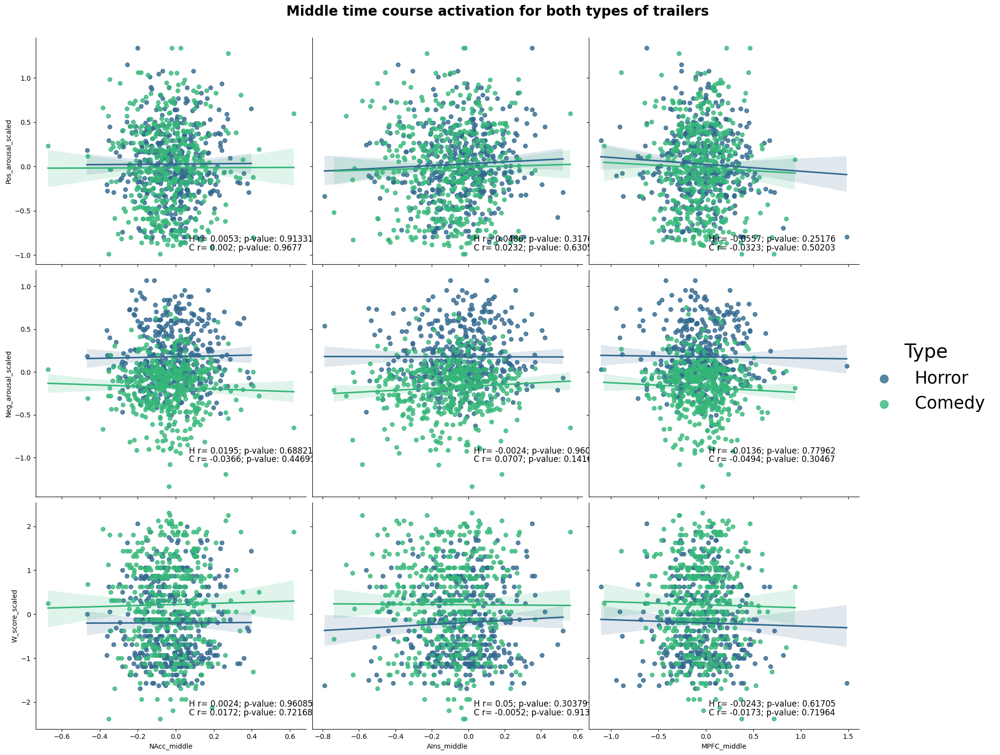

In [31]:
Mid_horror_corr = [NAcc_PA_Mid_H_corr, NAcc_NA_Mid_H_corr, NAcc_W_Mid_H_corr, AIns_PA_Mid_H_corr, AIns_NA_Mid_H_corr, AIns_W_Mid_H_corr, MPFC_PA_Mid_H_corr, MPFC_NA_Mid_H_corr, MPFC_W_Mid_H_corr]
Mid_comedy_corr = [NAcc_PA_Mid_C_corr, NAcc_NA_Mid_C_corr, NAcc_W_Mid_C_corr, AIns_PA_Mid_C_corr, AIns_NA_Mid_C_corr, AIns_W_Mid_C_corr, MPFC_PA_Mid_C_corr, MPFC_NA_Mid_C_corr, MPFC_W_Mid_C_corr]

title_middle = 'Middle time course activation for both types of trailers'
plot_correlations3_bothTrailers(all_subs_events_df, "middle", Mid_comedy_corr, Mid_horror_corr, title_middle)

## Neural activation onset

In [32]:
# Correlation with Positive Arousal.
NAcc_PA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_On_All_corr = pearsonr(all_subs_events_df["NAcc_onset"], all_subs_events_df["W_score_scaled"])
AIns_W_On_All_corr = pearsonr(all_subs_events_df["AIns_onset"], all_subs_events_df["W_score_scaled"])
MPFC_W_On_All_corr = pearsonr(all_subs_events_df["MPFC_onset"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_All_corr[1])))
print("For both types of trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_All_corr[1])))
print("For both types of trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_All_corr[1])))
print("For both types of trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_All_corr[1])))
print("For both types of trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_All_corr[1])))
print("For both types of trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_All_corr[1])))
print("For both types of trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_All_corr[1])))

For both types of trailers, the correlation between NAcc onset activation and positive arousal is: 0.04594 with a p-value of: 0.178786407422597
For both types of trailers, the correlation between AIns onset activation and positive arousal is: 0.06709 with a p-value of: 0.04947846084507177
For both types of trailers, the correlation between MPFC onset activation and positive arousal is: 0.01793 with a p-value of: 0.59987996593933

For both types of trailers, the correlation between NAcc onset activation and negative arousal is: 0.03207 with a p-value of: 0.34808694788486805
For both types of trailers, the correlation between AIns onset activation and negative arousal is: 0.05334 with a p-value of: 0.11847146121383659
For both types of trailers, the correlation between MPFC onset activation and negative arousal is: 0.00917 with a p-value of: 0.7885360298034602

For both types of trailers, the correlation between NAcc onset activation and watch scores is: 0.02016 with a p-value of: 0.5553

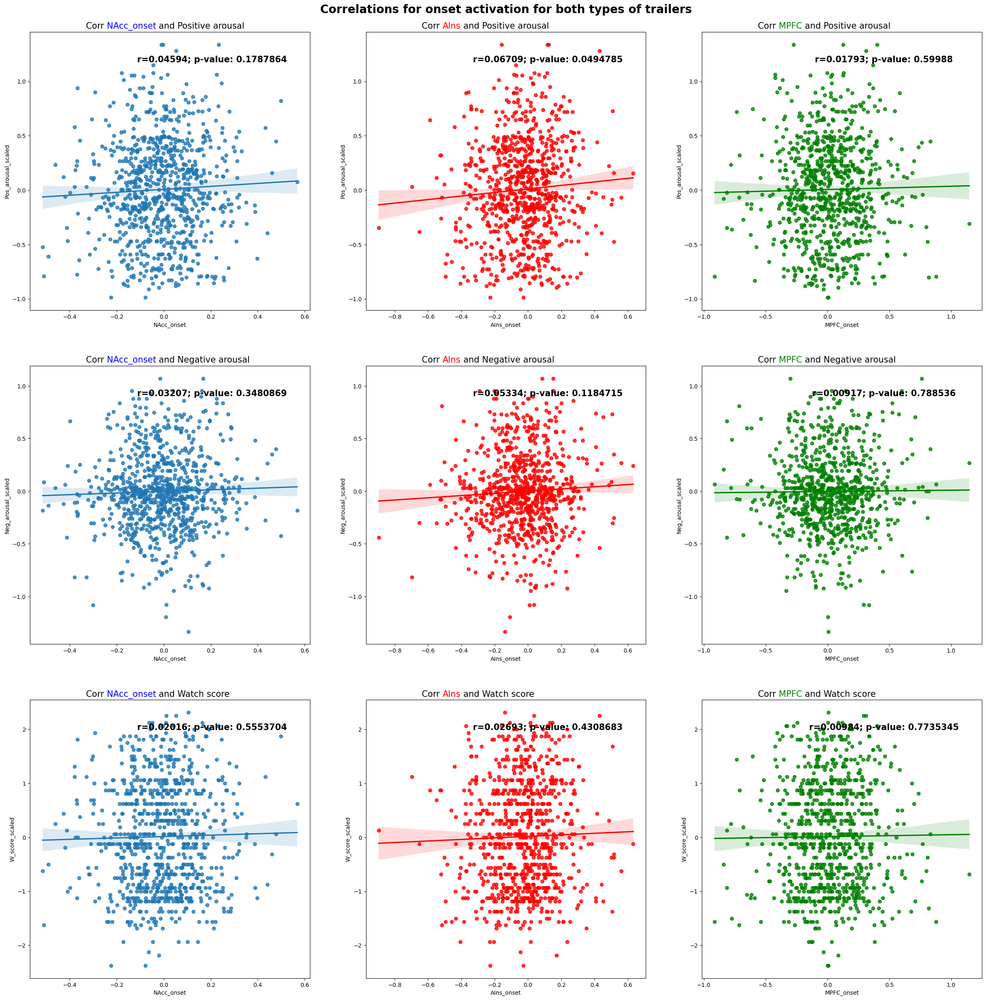

In [33]:
On_all_corr = [NAcc_PA_On_All_corr, NAcc_NA_On_All_corr, NAcc_W_On_All_corr, AIns_PA_On_All_corr, AIns_NA_On_All_corr, AIns_W_On_All_corr, MPFC_PA_On_All_corr, MPFC_NA_On_All_corr, MPFC_W_On_All_corr]
plot_correlations(all_subs_events_df, On_all_corr, "onset", "Correlations for onset activation for both types of trailers")

In [34]:
# Onset Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_On_C_corr = pearsonr(all_subs_events_comedy["NAcc_onset"], all_subs_events_comedy["W_score_scaled"])
AIns_W_On_C_corr = pearsonr(all_subs_events_comedy["AIns_onset"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_On_C_corr = pearsonr(all_subs_events_comedy["MPFC_onset"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_C_corr[1])))
print("For comedy trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_C_corr[1])))
print("For comedy trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_C_corr[1])))
print("For comedy trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_C_corr[1])))
print("For comedy trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_C_corr[1])))
print("For comedy trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_C_corr[1])))
print("For comedy trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_C_corr[1])))

For comedy trailers, the correlation between NAcc onset activation and positive arousal is: 0.12822 with a p-value of: 0.007552696967003625
For comedy trailers, the correlation between AIns onset activation and positive arousal is: 0.11986 with a p-value of: 0.012563130710524622
For comedy trailers, the correlation between MPFC onset activation and positive arousal is: 0.01007 with a p-value of: 0.8345277086393883

For comedy trailers, the correlation between NAcc onset activation and negative arousal is: 0.0176 with a p-value of: 0.7149030810792028
For comedy trailers, the correlation between AIns onset activation and negative arousal is: 0.01728 with a p-value of: 0.719989318399847
For comedy trailers, the correlation between MPFC onset activation and negative arousal is: 0.05233 with a p-value of: 0.27724973990277846

For comedy trailers, the correlation between NAcc onset activation and watch scores is: 0.08568 with a p-value of: 0.07491794450706117
For comedy trailers, the correla

In [35]:
# Onset Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_On_H_corr = pearsonr(all_subs_events_horror["NAcc_onset"], all_subs_events_horror["W_score_scaled"])
AIns_W_On_H_corr = pearsonr(all_subs_events_horror["AIns_onset"], all_subs_events_horror["W_score_scaled"])
MPFC_W_On_H_corr = pearsonr(all_subs_events_horror["MPFC_onset"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc onset activation and positive arousal is: " + str(round(NAcc_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_On_H_corr[1])))
print("For horror trailers, the correlation between AIns onset activation and positive arousal is: " + str(round(AIns_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_On_H_corr[1])))
print("For horror trailers, the correlation between MPFC onset activation and positive arousal is: " + str(round(MPFC_PA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_On_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc onset activation and negative arousal is: " + str(round(NAcc_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_On_H_corr[1])))
print("For horror trailers, the correlation between AIns onset activation and negative arousal is: " + str(round(AIns_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_On_H_corr[1])))
print("For horror trailers, the correlation between MPFC onset activation and negative arousal is: " + str(round(MPFC_NA_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_On_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc onset activation and watch scores is: " + str(round(NAcc_W_On_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_On_H_corr[1])))
print("For horror trailers, the correlation between AIns onset activation and watch scores is: " + str(round(AIns_W_On_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_On_H_corr[1])))
print("For horror trailers, the correlation between MPFC onset activation and watch scores is: " + str(round(MPFC_W_On_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_On_H_corr[1])))

For horror trailers, the correlation between NAcc onset activation and positive arousal is: -0.05154 with a p-value of: 0.28908827474858584
For horror trailers, the correlation between AIns onset activation and positive arousal is: -0.01183 with a p-value of: 0.8078675251435046
For horror trailers, the correlation between MPFC onset activation and positive arousal is: 0.03071 with a p-value of: 0.5278398971444362

For horror trailers, the correlation between NAcc onset activation and negative arousal is: 0.04833 with a p-value of: 0.3202314834011549
For horror trailers, the correlation between AIns onset activation and negative arousal is: 0.00748 with a p-value of: 0.8778031923538789
For horror trailers, the correlation between MPFC onset activation and negative arousal is: 0.00714 with a p-value of: 0.8832733268859492

For horror trailers, the correlation between NAcc onset activation and watch scores is: -0.05332 with a p-value of: 0.2727131901340146
For horror trailers, the correla

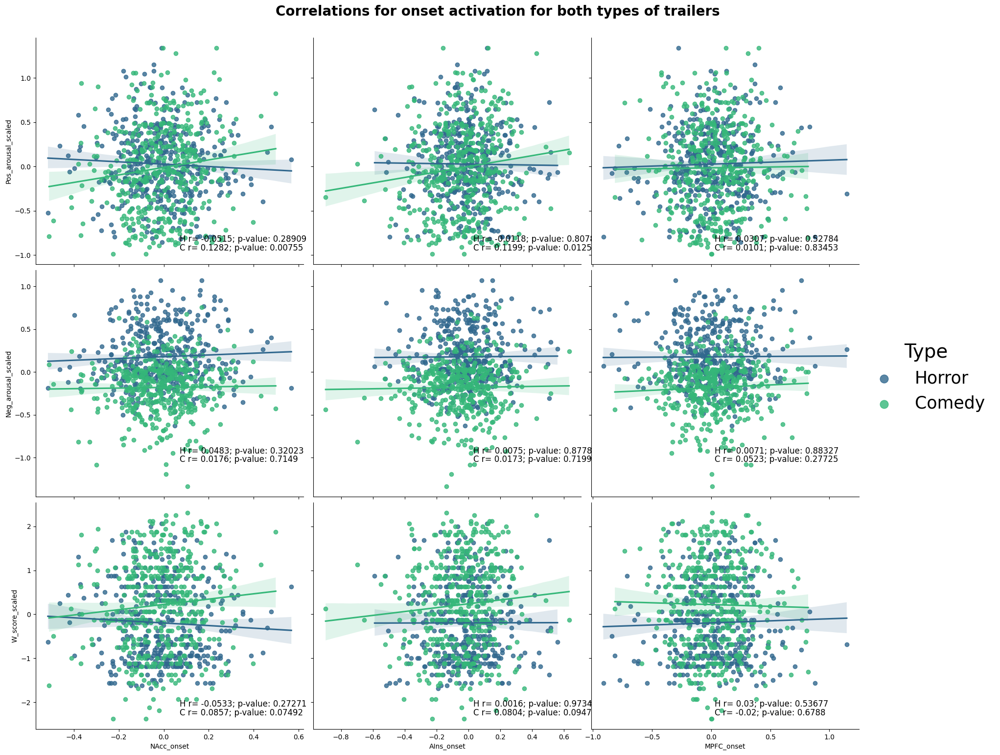

In [36]:
On_horror_corr = [NAcc_PA_On_H_corr, NAcc_NA_On_H_corr, NAcc_W_On_H_corr, AIns_PA_On_H_corr, AIns_NA_On_H_corr, AIns_W_On_H_corr, MPFC_PA_On_H_corr, MPFC_NA_On_H_corr, MPFC_W_On_H_corr]
On_comedy_corr = [NAcc_PA_On_C_corr, NAcc_NA_On_C_corr, NAcc_W_On_C_corr, AIns_PA_On_C_corr, AIns_NA_On_C_corr, AIns_W_On_C_corr, MPFC_PA_On_C_corr, MPFC_NA_On_C_corr, MPFC_W_On_C_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "onset", On_comedy_corr, On_horror_corr, "Correlations for onset activation for both types of trailers")



## Peak Max

In [37]:
# Correlation with Positive Arousal.
NAcc_PA_Pmax_All_corr = pearsonr(all_subs_events_df["NAcc_pos_peak"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Pmax_All_corr = pearsonr(all_subs_events_df["AIns_pos_peak"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Pmax_All_corr = pearsonr(all_subs_events_df["MPFC_pos_peak"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Pmax_All_corr = pearsonr(all_subs_events_df["NAcc_pos_peak"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Pmax_All_corr = pearsonr(all_subs_events_df["AIns_pos_peak"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Pmax_All_corr = pearsonr(all_subs_events_df["MPFC_pos_peak"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Pmax_All_corr = pearsonr(all_subs_events_df["NAcc_pos_peak"], all_subs_events_df["W_score_scaled"])
AIns_W_Pmax_All_corr = pearsonr(all_subs_events_df["AIns_pos_peak"], all_subs_events_df["W_score_scaled"])
MPFC_W_Pmax_All_corr = pearsonr(all_subs_events_df["MPFC_pos_peak"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc positive peak activation and positive arousal is: " + str(round(NAcc_PA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between AIns positive peak activation and positive arousal is: " + str(round(AIns_PA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between MPFC positive peak activation and positive arousal is: " + str(round(MPFC_PA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmax_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc positive peak activation and negative arousal is: " + str(round(NAcc_NA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between AIns positive peak activation and negative arousal is: " + str(round(AIns_NA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between MPFC positive peak activation and negative arousal is: " + str(round(MPFC_NA_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmax_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc positive peak activation and watch scores is: " + str(round(NAcc_W_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between AIns positive peak activation and watch scores is: " + str(round(AIns_W_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmax_All_corr[1])))
print("For both types of trailers, the correlation between MPFC positive peak activation and watch scores is: " + str(round(MPFC_W_Pmax_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmax_All_corr[1])))
      



For both types of trailers, the correlation between NAcc positive peak activation and positive arousal is: 0.04429 with a p-value of: 0.19493343444699943
For both types of trailers, the correlation between AIns positive peak activation and positive arousal is: 0.05577 with a p-value of: 0.10258263435935824
For both types of trailers, the correlation between MPFC positive peak activation and positive arousal is: -0.01074 with a p-value of: 0.7533265452603217

For both types of trailers, the correlation between NAcc positive peak activation and negative arousal is: 0.03506 with a p-value of: 0.30497025222013796
For both types of trailers, the correlation between AIns positive peak activation and negative arousal is: 0.09273 with a p-value of: 0.006567424936812492
For both types of trailers, the correlation between MPFC positive peak activation and negative arousal is: 0.00455 with a p-value of: 0.8940196421268856

For both types of trailers, the correlation between NAcc positive peak act

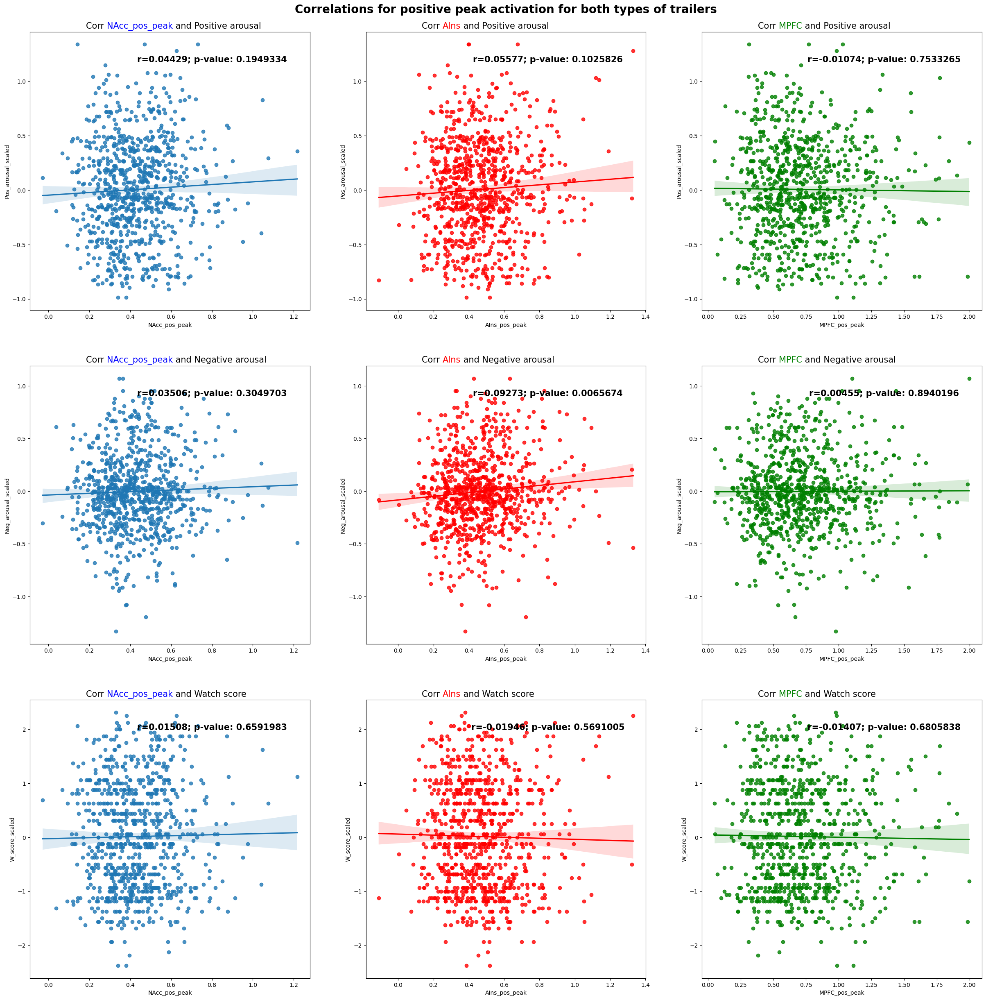

In [38]:
Pmax_all_corr = [NAcc_PA_Pmax_All_corr, NAcc_NA_Pmax_All_corr, NAcc_W_Pmax_All_corr, AIns_PA_Pmax_All_corr, AIns_NA_Pmax_All_corr, AIns_W_Pmax_All_corr, MPFC_PA_Pmax_All_corr, MPFC_NA_Pmax_All_corr, MPFC_W_Pmax_All_corr]
plot_correlations(all_subs_events_df, Pmax_all_corr, "pos_peak", "Correlations for positive peak activation for both types of trailers")


In [39]:
# Pos peak Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Pmax_C_corr = pearsonr(all_subs_events_comedy["NAcc_pos_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Pmax_C_corr = pearsonr(all_subs_events_comedy["AIns_pos_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Pmax_C_corr = pearsonr(all_subs_events_comedy["MPFC_pos_peak"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Pmax_C_corr = pearsonr(all_subs_events_comedy["NAcc_pos_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Pmax_C_corr = pearsonr(all_subs_events_comedy["AIns_pos_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Pmax_C_corr = pearsonr(all_subs_events_comedy["MPFC_pos_peak"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Pmax_C_corr = pearsonr(all_subs_events_comedy["NAcc_pos_peak"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Pmax_C_corr = pearsonr(all_subs_events_comedy["AIns_pos_peak"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Pmax_C_corr = pearsonr(all_subs_events_comedy["MPFC_pos_peak"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc positive peak activation and positive arousal is: " + str(round(NAcc_PA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between AIns positive peak activation and positive arousal is: " + str(round(AIns_PA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between MPFC positive peak activation and positive arousal is: " + str(round(MPFC_PA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmax_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc positive peak activation and negative arousal is: " + str(round(NAcc_NA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between AIns positive peak activation and negative arousal is: " + str(round(AIns_NA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between MPFC positive peak activation and negative arousal is: " + str(round(MPFC_NA_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmax_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc positive peak activation and watch scores is: " + str(round(NAcc_W_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between AIns positive peak activation and watch scores is: " + str(round(AIns_W_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmax_C_corr[1])))
print("For comedy trailers, the correlation between MPFC positive peak activation and watch scores is: " + str(round(MPFC_W_Pmax_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmax_C_corr[1])))
      
      


For comedy trailers, the correlation between NAcc positive peak activation and positive arousal is: 0.07906 with a p-value of: 0.10040927382507224
For comedy trailers, the correlation between AIns positive peak activation and positive arousal is: 0.05054 with a p-value of: 0.2940575770278034
For comedy trailers, the correlation between MPFC positive peak activation and positive arousal is: 0.01354 with a p-value of: 0.7787471482703209

For comedy trailers, the correlation between NAcc positive peak activation and negative arousal is: 0.00174 with a p-value of: 0.9711600095518149
For comedy trailers, the correlation between AIns positive peak activation and negative arousal is: 0.01125 with a p-value of: 0.815443755583816
For comedy trailers, the correlation between MPFC positive peak activation and negative arousal is: 0.01291 with a p-value of: 0.7888433582495917

For comedy trailers, the correlation between NAcc positive peak activation and watch scores is: 0.05621 with a p-value of:

In [40]:
# Pos peak Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Pmax_H_corr = pearsonr(all_subs_events_horror["NAcc_pos_peak"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Pmax_H_corr = pearsonr(all_subs_events_horror["AIns_pos_peak"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Pmax_H_corr = pearsonr(all_subs_events_horror["MPFC_pos_peak"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Pmax_H_corr = pearsonr(all_subs_events_horror["NAcc_pos_peak"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Pmax_H_corr = pearsonr(all_subs_events_horror["AIns_pos_peak"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Pmax_H_corr = pearsonr(all_subs_events_horror["MPFC_pos_peak"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Pmax_H_corr = pearsonr(all_subs_events_horror["NAcc_pos_peak"], all_subs_events_horror["W_score_scaled"])
AIns_W_Pmax_H_corr = pearsonr(all_subs_events_horror["AIns_pos_peak"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Pmax_H_corr = pearsonr(all_subs_events_horror["MPFC_pos_peak"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc positive peak activation and positive arousal is: " + str(round(NAcc_PA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between AIns positive peak activation and positive arousal is: " + str(round(AIns_PA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between MPFC positive peak activation and positive arousal is: " + str(round(MPFC_PA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmax_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc positive peak activation and negative arousal is: " + str(round(NAcc_NA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between AIns positive peak activation and negative arousal is: " + str(round(AIns_NA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmax_H_corr[1])))
print("For horror trailers, the correlation between MPFC positive peak activation and negative arousal is: " + str(round(MPFC_NA_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmax_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc positive peak activation and watch scores is: " + str(round(NAcc_W_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmax_H_corr[1])))
print("For horror trailers, the correlation between AIns positive peak activation and watch scores is: " + str(round(AIns_W_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmax_H_corr[1])))
print("For horror trailers, the correlation between MPFC positive peak activation and watch scores is: " + str(round(MPFC_W_Pmax_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmax_H_corr[1])))


For horror trailers, the correlation between NAcc positive peak activation and positive arousal is: -0.00049 with a p-value of: 0.9919136900399941
For horror trailers, the correlation between AIns positive peak activation and positive arousal is: 0.05468 with a p-value of: 0.2606893017080364
For horror trailers, the correlation between MPFC positive peak activation and positive arousal is: -0.038 with a p-value of: 0.434552067731727

For horror trailers, the correlation between NAcc positive peak activation and negative arousal is: 0.05266 with a p-value of: 0.2787713262120488
For horror trailers, the correlation between AIns positive peak activation and negative arousal is: 0.1025 with a p-value of: 0.03464961020754879
For horror trailers, the correlation between MPFC positive peak activation and negative arousal is: 0.03668 with a p-value of: 0.4507345629998957

For horror trailers, the correlation between NAcc positive peak activation and watch scores is: -0.02414 with a p-value of:

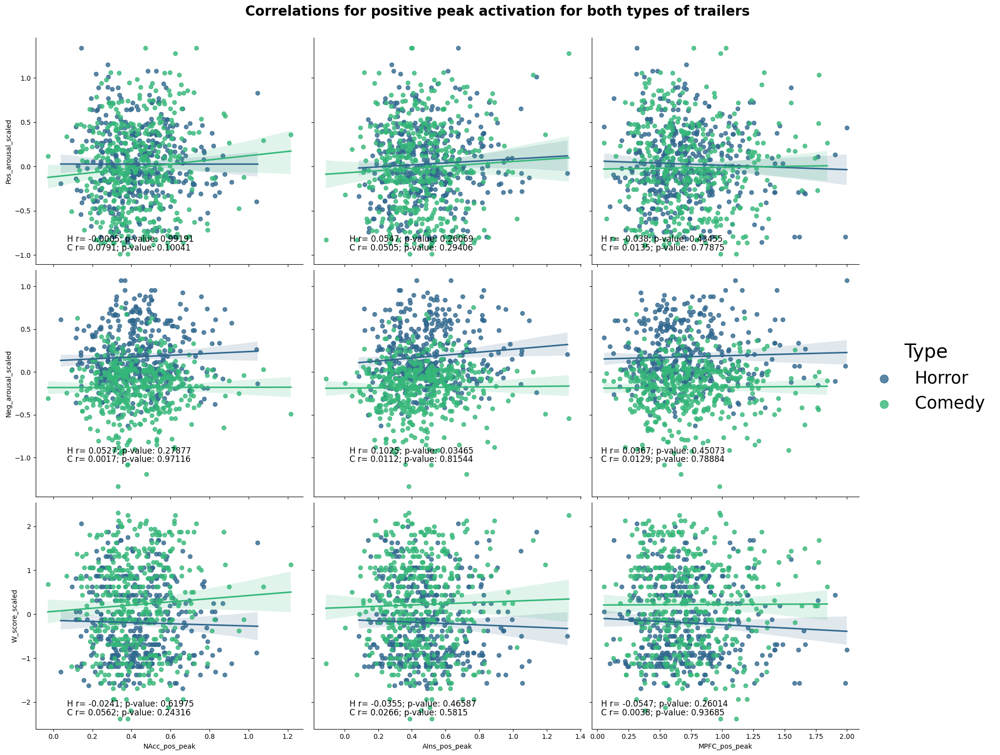

In [41]:
Pmax_comedy_corr = [NAcc_PA_Pmax_C_corr, NAcc_NA_Pmax_C_corr, NAcc_W_Pmax_C_corr, AIns_PA_Pmax_C_corr, AIns_NA_Pmax_C_corr, AIns_W_Pmax_C_corr, MPFC_PA_Pmax_C_corr, MPFC_NA_Pmax_C_corr, MPFC_W_Pmax_C_corr]
Pmax_horror_corr = [NAcc_PA_Pmax_H_corr, NAcc_NA_Pmax_H_corr, NAcc_W_Pmax_H_corr, AIns_PA_Pmax_H_corr, AIns_NA_Pmax_H_corr, AIns_W_Pmax_H_corr, MPFC_PA_Pmax_H_corr, MPFC_NA_Pmax_H_corr, MPFC_W_Pmax_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "pos_peak", Pmax_comedy_corr, Pmax_horror_corr, "Correlations for positive peak activation for both types of trailers")

## Peak min

In [42]:
# Correlation with Positive Arousal.
NAcc_PA_Pmin_All_corr = pearsonr(all_subs_events_df["NAcc_neg_peak"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_Pmin_All_corr = pearsonr(all_subs_events_df["AIns_neg_peak"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_Pmin_All_corr = pearsonr(all_subs_events_df["MPFC_neg_peak"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_Pmin_All_corr = pearsonr(all_subs_events_df["NAcc_neg_peak"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_Pmin_All_corr = pearsonr(all_subs_events_df["AIns_neg_peak"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_Pmin_All_corr = pearsonr(all_subs_events_df["MPFC_neg_peak"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_Pmin_All_corr = pearsonr(all_subs_events_df["NAcc_neg_peak"], all_subs_events_df["W_score_scaled"])
AIns_W_Pmin_All_corr = pearsonr(all_subs_events_df["AIns_neg_peak"], all_subs_events_df["W_score_scaled"])
MPFC_W_Pmin_All_corr = pearsonr(all_subs_events_df["MPFC_neg_peak"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc negative peak activation and positive arousal is: " + str(round(NAcc_PA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between AIns negative peak activation and positive arousal is: " + str(round(AIns_PA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between MPFC negative peak activation and positive arousal is: " + str(round(MPFC_PA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmin_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc negative peak activation and negative arousal is: " + str(round(NAcc_NA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between AIns negative peak activation and negative arousal is: " + str(round(AIns_NA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between MPFC negative peak activation and negative arousal is: " + str(round(MPFC_NA_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmin_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc negative peak activation and watch scores is: " + str(round(NAcc_W_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between AIns negative peak activation and watch scores is: " + str(round(AIns_W_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmin_All_corr[1])))
print("For both types of trailers, the correlation between MPFC negative peak activation and watch scores is: " + str(round(MPFC_W_Pmin_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmin_All_corr[1])))
      
      

For both types of trailers, the correlation between NAcc negative peak activation and positive arousal is: 0.03388 with a p-value of: 0.3216060036539749
For both types of trailers, the correlation between AIns negative peak activation and positive arousal is: 0.02319 with a p-value of: 0.4974974887751392
For both types of trailers, the correlation between MPFC negative peak activation and positive arousal is: 0.01765 with a p-value of: 0.6055913962761705

For both types of trailers, the correlation between NAcc negative peak activation and negative arousal is: -0.01638 with a p-value of: 0.6318555624172568
For both types of trailers, the correlation between AIns negative peak activation and negative arousal is: 0.11511 with a p-value of: 0.0007301182185933853
For both types of trailers, the correlation between MPFC negative peak activation and negative arousal is: 0.00177 with a p-value of: 0.9586283014585191

For both types of trailers, the correlation between NAcc negative peak activ

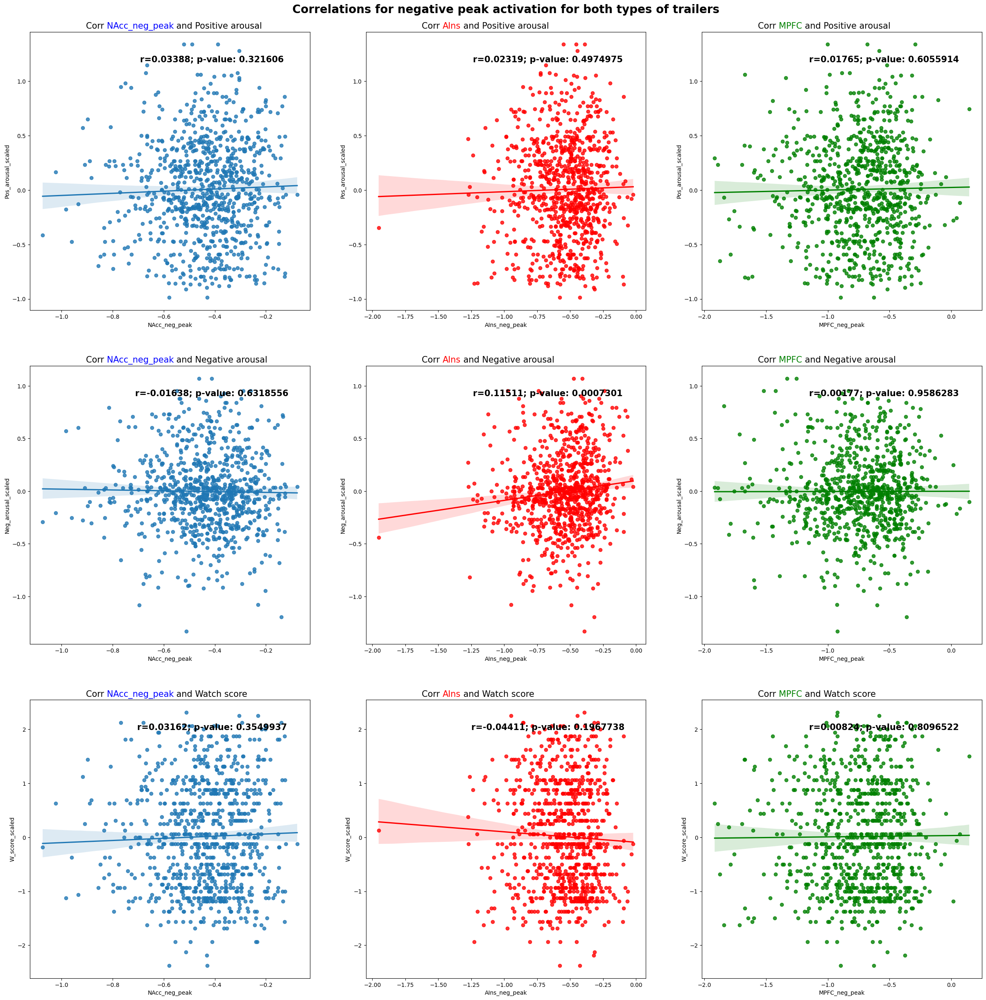

In [43]:
Pmin_all_corr = [NAcc_PA_Pmin_All_corr, NAcc_NA_Pmin_All_corr, NAcc_W_Pmin_All_corr, AIns_PA_Pmin_All_corr, AIns_NA_Pmin_All_corr, AIns_W_Pmin_All_corr, MPFC_PA_Pmin_All_corr, MPFC_NA_Pmin_All_corr, MPFC_W_Pmin_All_corr]
plot_correlations(all_subs_events_df, Pmin_all_corr, "neg_peak", "Correlations for negative peak activation for both types of trailers")

In [44]:
# Neg peak Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_Pmin_C_corr = pearsonr(all_subs_events_comedy["NAcc_neg_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_Pmin_C_corr = pearsonr(all_subs_events_comedy["AIns_neg_peak"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_Pmin_C_corr = pearsonr(all_subs_events_comedy["MPFC_neg_peak"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_Pmin_C_corr = pearsonr(all_subs_events_comedy["NAcc_neg_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_Pmin_C_corr = pearsonr(all_subs_events_comedy["AIns_neg_peak"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_Pmin_C_corr = pearsonr(all_subs_events_comedy["MPFC_neg_peak"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_Pmin_C_corr = pearsonr(all_subs_events_comedy["NAcc_neg_peak"], all_subs_events_comedy["W_score_scaled"])
AIns_W_Pmin_C_corr = pearsonr(all_subs_events_comedy["AIns_neg_peak"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_Pmin_C_corr = pearsonr(all_subs_events_comedy["MPFC_neg_peak"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc negative peak activation and positive arousal is: " + str(round(NAcc_PA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between AIns negative peak activation and positive arousal is: " + str(round(AIns_PA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between MPFC negative peak activation and positive arousal is: " + str(round(MPFC_PA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmin_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc negative peak activation and negative arousal is: " + str(round(NAcc_NA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between AIns negative peak activation and negative arousal is: " + str(round(AIns_NA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between MPFC negative peak activation and negative arousal is: " + str(round(MPFC_NA_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmin_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc negative peak activation and watch scores is: " + str(round(NAcc_W_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between AIns negative peak activation and watch scores is: " + str(round(AIns_W_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmin_C_corr[1])))
print("For comedy trailers, the correlation between MPFC negative peak activation and watch scores is: " + str(round(MPFC_W_Pmin_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmin_C_corr[1])))


For comedy trailers, the correlation between NAcc negative peak activation and positive arousal is: 0.03061 with a p-value of: 0.525279455328784
For comedy trailers, the correlation between AIns negative peak activation and positive arousal is: 0.08883 with a p-value of: 0.06479687170322104
For comedy trailers, the correlation between MPFC negative peak activation and positive arousal is: -0.02065 with a p-value of: 0.6683173073262637

For comedy trailers, the correlation between NAcc negative peak activation and negative arousal is: 0.04295 with a p-value of: 0.37257635546468465
For comedy trailers, the correlation between AIns negative peak activation and negative arousal is: 0.07221 with a p-value of: 0.1335366636066377
For comedy trailers, the correlation between MPFC negative peak activation and negative arousal is: 0.05776 with a p-value of: 0.2303761087090071

For comedy trailers, the correlation between NAcc negative peak activation and watch scores is: -0.00154 with a p-value 

In [45]:
# Neg peak Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_Pmin_H_corr = pearsonr(all_subs_events_horror["NAcc_neg_peak"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_Pmin_H_corr = pearsonr(all_subs_events_horror["AIns_neg_peak"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_Pmin_H_corr = pearsonr(all_subs_events_horror["MPFC_neg_peak"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_Pmin_H_corr = pearsonr(all_subs_events_horror["NAcc_neg_peak"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_Pmin_H_corr = pearsonr(all_subs_events_horror["AIns_neg_peak"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_Pmin_H_corr = pearsonr(all_subs_events_horror["MPFC_neg_peak"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_Pmin_H_corr = pearsonr(all_subs_events_horror["NAcc_neg_peak"], all_subs_events_horror["W_score_scaled"])
AIns_W_Pmin_H_corr = pearsonr(all_subs_events_horror["AIns_neg_peak"], all_subs_events_horror["W_score_scaled"])
MPFC_W_Pmin_H_corr = pearsonr(all_subs_events_horror["MPFC_neg_peak"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc negative peak activation and positive arousal is: " + str(round(NAcc_PA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between AIns negative peak activation and positive arousal is: " + str(round(AIns_PA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between MPFC negative peak activation and positive arousal is: " + str(round(MPFC_PA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_Pmin_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc negative peak activation and negative arousal is: " + str(round(NAcc_NA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between AIns negative peak activation and negative arousal is: " + str(round(AIns_NA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_Pmin_H_corr[1])))
print("For horror trailers, the correlation between MPFC negative peak activation and negative arousal is: " + str(round(MPFC_NA_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_Pmin_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc negative peak activation and watch scores is: " + str(round(NAcc_W_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_Pmin_H_corr[1])))
print("For horror trailers, the correlation between AIns negative peak activation and watch scores is: " + str(round(AIns_W_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_Pmin_H_corr[1])))
print("For horror trailers, the correlation between MPFC negative peak activation and watch scores is: " + str(round(MPFC_W_Pmin_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_Pmin_H_corr[1])))
      

For horror trailers, the correlation between NAcc negative peak activation and positive arousal is: 0.04428 with a p-value of: 0.362492462118256
For horror trailers, the correlation between AIns negative peak activation and positive arousal is: -0.08331 with a p-value of: 0.08626897786666675
For horror trailers, the correlation between MPFC negative peak activation and positive arousal is: 0.06407 with a p-value of: 0.1874132723519898

For horror trailers, the correlation between NAcc negative peak activation and negative arousal is: -0.01726 with a p-value of: 0.7227661874229828
For horror trailers, the correlation between AIns negative peak activation and negative arousal is: 0.03566 with a p-value of: 0.4634644998602587
For horror trailers, the correlation between MPFC negative peak activation and negative arousal is: -0.05775 with a p-value of: 0.23484685514554118

For horror trailers, the correlation between NAcc negative peak activation and watch scores is: 0.04811 with a p-value

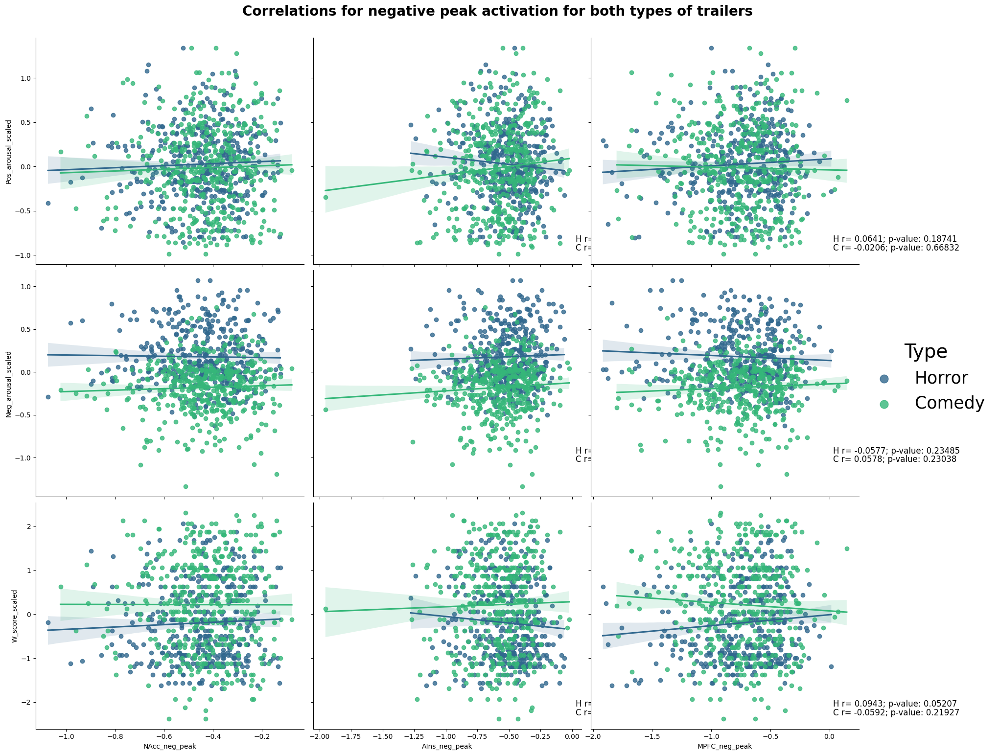

In [46]:
Pmin_comedy_corr = [NAcc_PA_Pmin_C_corr, NAcc_NA_Pmin_C_corr, NAcc_W_Pmin_C_corr, AIns_PA_Pmin_C_corr, AIns_NA_Pmin_C_corr, AIns_W_Pmin_C_corr, MPFC_PA_Pmin_C_corr, MPFC_NA_Pmin_C_corr, MPFC_W_Pmin_C_corr]
Pmin_horror_corr = [NAcc_PA_Pmin_H_corr, NAcc_NA_Pmin_H_corr, NAcc_W_Pmin_H_corr, AIns_PA_Pmin_H_corr, AIns_NA_Pmin_H_corr, AIns_W_Pmin_H_corr, MPFC_PA_Pmin_H_corr, MPFC_NA_Pmin_H_corr, MPFC_W_Pmin_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "neg_peak", Pmin_comedy_corr, Pmin_horror_corr, "Correlations for negative peak activation for both types of trailers")

## Positive peak (slope) 

## Positive peak (delta)

## Neural ISC

In [47]:
# Correlation with Positive Arousal.
NAcc_PA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Pos_arousal_scaled"])
AIns_PA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Pos_arousal_scaled"])
MPFC_PA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Pos_arousal_scaled"])

# Correlation with Negative Arousal.
NAcc_NA_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["Neg_arousal_scaled"])
AIns_NA_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["Neg_arousal_scaled"])
MPFC_NA_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["Neg_arousal_scaled"])

# Correlation with Watch Scores.
NAcc_W_ISC_All_corr = pearsonr(all_subs_events_df["NAcc_ISC"], all_subs_events_df["W_score_scaled"])
AIns_W_ISC_All_corr = pearsonr(all_subs_events_df["AIns_ISC"], all_subs_events_df["W_score_scaled"])
MPFC_W_ISC_All_corr = pearsonr(all_subs_events_df["MPFC_ISC"], all_subs_events_df["W_score_scaled"])

print("For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_All_corr[1])))

print("\nFor both types of trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_All_corr[1])))
print("For both types of trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_All_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_All_corr[1])))


For both types of trailers, the correlation between NAcc ISC activation and positive arousal is: 0.0733 with a p-value of: 0.031811577019703524
For both types of trailers, the correlation between AIns ISC activation and positive arousal is: 0.05119 with a p-value of: 0.134072175028174
For both types of trailers, the correlation between MPFC ISC activation and positive arousal is: 0.09783 with a p-value of: 0.004127841823025

For both types of trailers, the correlation between NAcc ISC activation and negative arousal is: -0.06549 with a p-value of: 0.055146844754096445
For both types of trailers, the correlation between AIns ISC activation and negative arousal is: -0.04593 with a p-value of: 0.17888701755092154
For both types of trailers, the correlation between MPFC ISC activation and negative arousal is: -0.03496 with a p-value of: 0.3063210695429557

For both types of trailers, the correlation between NAcc ISC activation and watch scores is: 0.0835 with a p-value of: 0.01442815427599

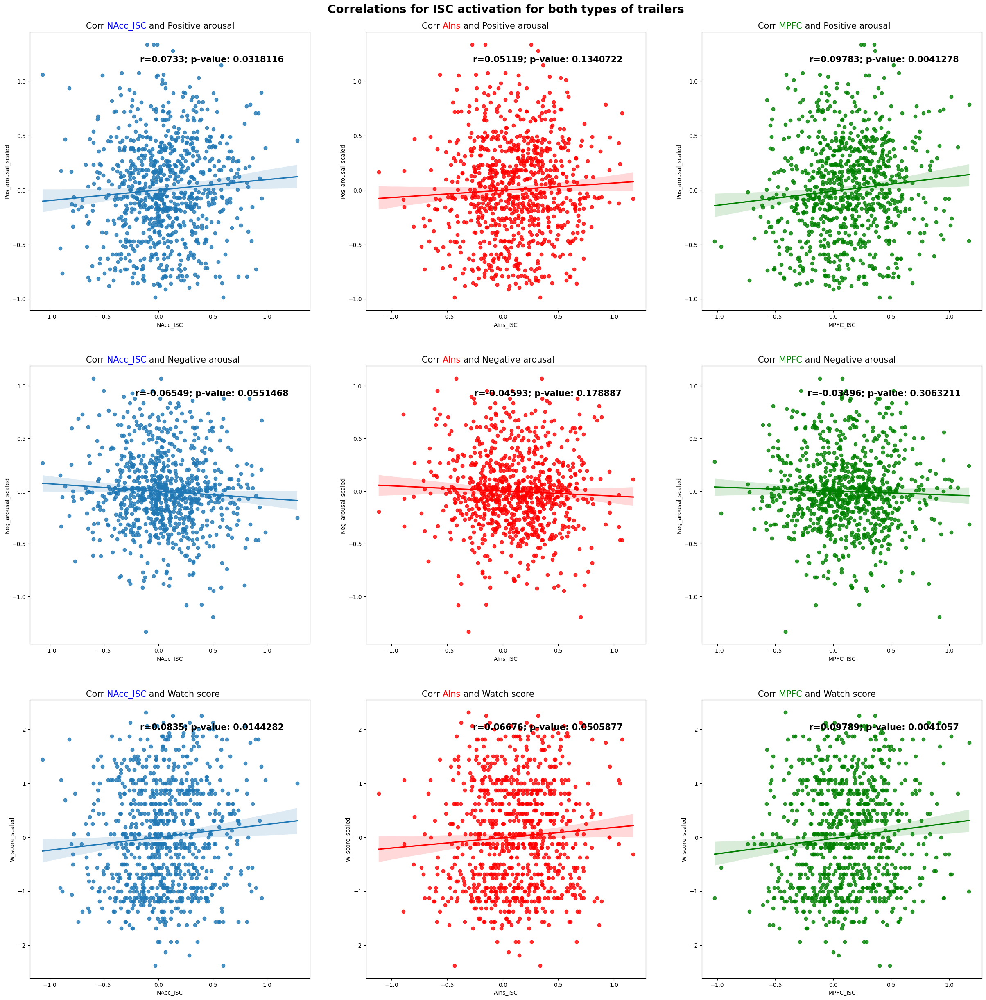

In [48]:
ISC_all_corr = [NAcc_PA_ISC_All_corr, NAcc_NA_ISC_All_corr, NAcc_W_ISC_All_corr, AIns_PA_ISC_All_corr, AIns_NA_ISC_All_corr, AIns_W_ISC_All_corr, MPFC_PA_ISC_All_corr, MPFC_NA_ISC_All_corr, MPFC_W_ISC_All_corr]
plot_correlations(all_subs_events_df, ISC_all_corr, "ISC", "Correlations for ISC activation for both types of trailers")


In [49]:
# ISC Neural Activation and PA-NA for Comedy Trailers.
NAcc_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
AIns_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])
MPFC_PA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Pos_arousal_scaled"])

NAcc_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
AIns_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])
MPFC_NA_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["Neg_arousal_scaled"])

NAcc_W_ISC_C_corr = pearsonr(all_subs_events_comedy["NAcc_ISC"], all_subs_events_comedy["W_score_scaled"])
AIns_W_ISC_C_corr = pearsonr(all_subs_events_comedy["AIns_ISC"], all_subs_events_comedy["W_score_scaled"])
MPFC_W_ISC_C_corr = pearsonr(all_subs_events_comedy["MPFC_ISC"], all_subs_events_comedy["W_score_scaled"])

print("For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_C_corr[1])))

print("\nFor comedy trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_C_corr[1])))
print("For comedy trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_C_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_C_corr[1])))


For comedy trailers, the correlation between NAcc ISC activation and positive arousal is: 0.15845 with a p-value of: 0.0009377739048509482
For comedy trailers, the correlation between AIns ISC activation and positive arousal is: 0.08441 with a p-value of: 0.07934515962120695
For comedy trailers, the correlation between MPFC ISC activation and positive arousal is: 0.13371 with a p-value of: 0.005324567949821048

For comedy trailers, the correlation between NAcc ISC activation and negative arousal is: -0.06967 with a p-value of: 0.1478308484085465
For comedy trailers, the correlation between AIns ISC activation and negative arousal is: -0.05688 with a p-value of: 0.23752036785496658
For comedy trailers, the correlation between MPFC ISC activation and negative arousal is: -0.06481 with a p-value of: 0.17824005095704584

For comedy trailers, the correlation between NAcc ISC activation and watch scores is: 0.14293 with a p-value of: 0.0028731306466955107
For comedy trailers, the correlation

In [50]:
# ISC Neural Activation and PA-NA for Horror Trailers.
NAcc_PA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
AIns_PA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Pos_arousal_scaled"])
MPFC_PA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Pos_arousal_scaled"])

NAcc_NA_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
AIns_NA_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["Neg_arousal_scaled"])
MPFC_NA_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["Neg_arousal_scaled"])

NAcc_W_ISC_H_corr = pearsonr(all_subs_events_horror["NAcc_ISC"], all_subs_events_horror["W_score_scaled"])
AIns_W_ISC_H_corr = pearsonr(all_subs_events_horror["AIns_ISC"], all_subs_events_horror["W_score_scaled"])
MPFC_W_ISC_H_corr = pearsonr(all_subs_events_horror["MPFC_ISC"], all_subs_events_horror["W_score_scaled"])

print("For horror trailers, the correlation between NAcc ISC activation and positive arousal is: " + str(round(NAcc_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and positive arousal is: " + str(round(AIns_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_PA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and positive arousal is: " + str(round(MPFC_PA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_PA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and negative arousal is: " + str(round(NAcc_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and negative arousal is: " + str(round(AIns_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_NA_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and negative arousal is: " + str(round(MPFC_NA_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_NA_ISC_H_corr[1])))

print("\nFor horror trailers, the correlation between NAcc ISC activation and watch scores is: " + str(round(NAcc_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((NAcc_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between AIns ISC activation and watch scores is: " + str(round(AIns_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((AIns_W_ISC_H_corr[1])))
print("For horror trailers, the correlation between MPFC ISC activation and watch scores is: " + str(round(MPFC_W_ISC_H_corr[0], 5)) + " with a p-value of: " + str((MPFC_W_ISC_H_corr[1])))



For horror trailers, the correlation between NAcc ISC activation and positive arousal is: -0.03924 with a p-value of: 0.41969284473335844
For horror trailers, the correlation between AIns ISC activation and positive arousal is: 0.01603 with a p-value of: 0.7417173107242626
For horror trailers, the correlation between MPFC ISC activation and positive arousal is: 0.05509 with a p-value of: 0.25708396977097986

For horror trailers, the correlation between NAcc ISC activation and negative arousal is: -0.08998 with a p-value of: 0.06383883386610474
For horror trailers, the correlation between AIns ISC activation and negative arousal is: -0.01924 with a p-value of: 0.6925286026943174
For horror trailers, the correlation between MPFC ISC activation and negative arousal is: 0.01467 with a p-value of: 0.7629374453892765

For horror trailers, the correlation between NAcc ISC activation and watch scores is: 0.01464 with a p-value of: 0.7634350457950052
For horror trailers, the correlation between

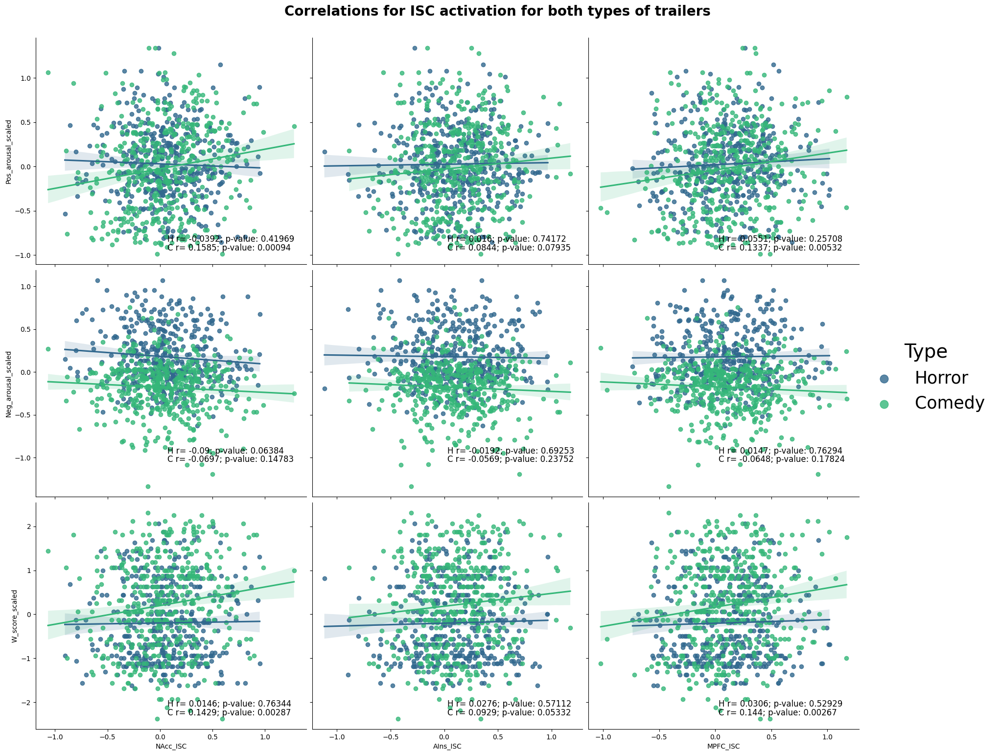

In [51]:
ISC_comedy_corr = [NAcc_PA_ISC_C_corr, NAcc_NA_ISC_C_corr, NAcc_W_ISC_C_corr, AIns_PA_ISC_C_corr, AIns_NA_ISC_C_corr, AIns_W_ISC_C_corr, MPFC_PA_ISC_C_corr, MPFC_NA_ISC_C_corr, MPFC_W_ISC_C_corr]
ISC_horror_corr = [NAcc_PA_ISC_H_corr, NAcc_NA_ISC_H_corr, NAcc_W_ISC_H_corr, AIns_PA_ISC_H_corr, AIns_NA_ISC_H_corr, AIns_W_ISC_H_corr, MPFC_PA_ISC_H_corr, MPFC_NA_ISC_H_corr, MPFC_W_ISC_H_corr]
plot_correlations3_bothTrailers(all_subs_events_df, "ISC", ISC_comedy_corr, ISC_horror_corr, "Correlations for ISC activation for both types of trailers")
